# Análisis Exploratorio de datos

## Cargue de los datos

### Importación de librerías

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from scipy.stats import skew

from sklearn.preprocessing import OrdinalEncoder
import plotly.express as px
import warnings


warnings.filterwarnings('ignore')
sns.set(style="whitegrid")


### Funciones generales


In [2]:

def to_snake_case(text):
    text = re.sub('(.)([A-Z][a-z]+)', r'\1_/2', text)
    text = re.sub('([a-z0-9])([A-Z])', r'/1_/2', text)
    return text.lower().replace(' ', '_')


def convert_int_format(cadena):
    try:
        # Intentar convertir el string a float y luego a entero
        return str(int(float(cadena)))
    except ValueError:
        # Si no es un número, devolver el valor original
        return cadena
    
def delete_columns_by_word(df, palabras):
    df_deleted = df.loc[:, ~df.columns.str.contains(palabras, case=False)]
    print("Columnas eliminadas: ", df.columns.difference(df_deleted.columns))
    return df_deleted



def calcular_porcentaje_nulos(df):
    """
    Calcula el porcentaje de valores nulos por columna en un DataFrame y genera un gráfico de barras.
    Parámetros:
    df (pandas.DataFrame): El DataFrame sobre el cual se calcularán los porcentajes de valores nulos.
    Retorna:
    pandas.Series: Una serie con los porcentajes de valores nulos por columna, ordenados de mayor a menor.
    El gráfico de barras muestra el porcentaje de valores nulos por columna, con un diseño profesional.
    """

    porcentaje_nulos = df.isnull().mean() * 100
    porcentaje_nulos = porcentaje_nulos.sort_values(ascending=False)
    
    # Crear el DataFrame para el gráfico
    df_nulos = porcentaje_nulos.reset_index()
    df_nulos.columns = ['Columnas', 'Porcentaje de Nulos']

    # Crear el gráfico
    fig = px.bar(df_nulos, 
                 x='Columnas', 
                 y='Porcentaje de Nulos', 
                 title='Porcentaje de Valores Nulos por Columna',
                 labels={'Porcentaje de Nulos': 'Porcentaje (%)'},
                 text='Porcentaje de Nulos')

    # Ajustar el diseño para hacerlo más profesional
    fig.update_traces(texttemplate='%{text:.2f}%', textposition='outside')
    fig.update_layout(yaxis_range=[0, 100], 
                      xaxis_title='Columnas', 
                      yaxis_title='Porcentaje de Nulos (%)',
                      title_x=0.5,
                      template='plotly_white')

    # Mostrar el gráfico
    fig.show()

    return porcentaje_nulos

def analyze_skew(df, columnas, umbral_sesgo=0.5):
    """
    Analiza el sesgo (asimetría) de las columnas numéricas en un DataFrame y genera gráficos de histograma
    para aquellas columnas cuyo sesgo absoluto supera un umbral especificado.
    Parámetros:
    df (pandas.DataFrame): El DataFrame que contiene los datos a analizar.
    columnas (list): Lista de nombres de columnas a analizar.
    umbral_sesgo (float, opcional): El umbral de sesgo absoluto para determinar si una columna tiene un sesgo significativo. 
                                    El valor por defecto es 0.5.
    Retorno:
    None: Esta función no retorna ningún valor. Imprime mensajes y muestra gráficos de histograma.
    Ejemplo:
    >>> analyze_skew(df, ['col1', 'col2'], umbral_sesgo=1.0)
    La columna 'col1' tiene sesgo (skew: 1.23). Generando gráfico...
    La columna 'col2' no tiene sesgo significativo (skew: 0.45).
    """

    for col in columnas:
        if col in df.select_dtypes(include='number').columns:
            # Calcular el sesgo (asimetría)
            sesgo = skew(df[col].dropna())
            
            # Verificar si el sesgo es mayor que el umbral
            if abs(sesgo) > umbral_sesgo:
                print(f"La columna '{col}' tiene sesgo (skew: {sesgo:.2f}). Generando gráfico...")

                # Graficar la columna
                fig = px.histogram(df, x=col, title=f'Distribución de {col} (Sesgo: {sesgo:.2f})',
                                   nbins=30, labels={col: f'{col}'})
                
                # Ajustar el diseño del gráfico
                fig.update_layout(
                    title_x=0.5,
                    xaxis_title=f'{col}',
                    yaxis_title='Frecuencia',
                    template='plotly_white',
                    bargap=0.1
                )
                fig.update_traces(marker_color='teal')
                
                fig.show()
            else:
                print(f"La columna '{col}' no tiene sesgo significativo (skew: {sesgo:.2f}).")
        else:
            print(f"La columna '{col}' no es numérica o no existe en el DataFrame.")



def analyze_correlation(df, columnas, metodo='spearman'):
    """
    Esta función analiza las correlaciones de Spearman o Pearson entre las columnas numéricas del DataFrame,
    muestra un heatmap de la correlación y una matriz de dispersión.

    Argumentos:
    - df: DataFrame de entrada.
    - columnas: Lista de columnas a analizar.
    - metodo: 'spearman' o 'pearson' para elegir el tipo de correlación.
    """
    # Filtrar las columnas numéricas de interés
    df_numerico = df[columnas].select_dtypes(include='number')
    
    if df_numerico.empty:
        print("No se encontraron columnas numéricas en la lista proporcionada.")
        return

    # Calcular la matriz de correlación con el método seleccionado
    correlacion = df_numerico.corr(method=metodo)
    
    # Eliminar la diagonal (autocorrelaciones) y quedarnos solo con las correlaciones superiores
    mask = np.triu(np.ones(correlacion.shape), k=1).astype(bool)
    correlacion_upper = correlacion.where(mask)
    
    # Obtener las 10 correlaciones más altas en magnitud absoluta
    top_10_correlaciones = correlacion_upper.abs().unstack().dropna().sort_values(ascending=False).head(10)

    # Imprimir las 10 correlaciones más altas con los nombres de las columnas
    print(f"\nLas 10 correlaciones más altas (en magnitud absoluta) usando {metodo.capitalize()}:\n")
    for (col1, col2), correlacion_value in top_10_correlaciones.items():
        print(f"{col1} y {col2}: {correlacion_value:.2f}")
    
    # Crear el heatmap con formato de texto
    fig = px.imshow(correlacion,
                    text_auto='.2f',  # Formato para mostrar dos decimales
                    labels=dict(color="Correlación"),
                    x=correlacion.columns,
                    y=correlacion.index,
                    title=f"Heatmap de Correlación ({metodo.capitalize()})")
    
    # Ajustar el diseño del heatmap
    fig.update_layout(
        title_x=0.5,
        template='plotly_white',
        coloraxis_colorbar=dict(title="Correlación"),
        xaxis_title='Columnas',
        yaxis_title='Columnas'
    )

    # Mostrar el gráfico del heatmap
    fig.show()

    # Crear la matriz de dispersión (pair plot) usando Seaborn
    print("\nMostrando la matriz de dispersión (pair plot) entre las variables...\n")
    sns.pairplot(df_numerico)
    plt.show()

    return correlacion


def apply_one_hot_encoding(df, categorical_columns):
    """
    Aplica One Hot Encoding a las columnas categóricas de un DataFrame.

    :param df: DataFrame original
    :param categorical_columns: Lista de nombres de columnas categóricas a codificar
    :return: DataFrame con las columnas categóricas codificadas
    """
    # Comprobar que las columnas categóricas estén en el DataFrame
    for column in categorical_columns:
        if column not in df.columns:
            raise ValueError(f"La columna '{column}' no está en el DataFrame.")
    
    # Aplicar One Hot Encoding
    df_encoded = pd.get_dummies(df, columns=categorical_columns, drop_first=True)
    
    return df_encoded

### Seteo de rutas

In [3]:
sheet_field_names = 'Variables'
first_row_excels= 16
sheet_dict_values = 'Valores'


path_dem_adults_catalog = './Data/Encuestas/DataDemografica/AdolescentesAdultos/ensafrec_ad2022_entrega_w.Catlogo.xlsx'
path_dem_adults_data = './Data/Encuestas/DataDemografica/AdolescentesAdultos/ensafrec_ad2022_entrega_w.csv'
path_food_adults_catalog = './Data/Encuestas/Alimentos/AdolescentesAdultos/ensafrec_ad2022_rec_w.Catlogo.xlsx'
path_food_adults_data = './Data/Encuestas/Alimentos/AdolescentesAdultos/ensafrec_ad2022_rec_w.csv'


path_dem_school_catalog = './Data/Encuestas/DataDemografica/Escolares/ensafrec_es2022_entrega_w.Catlogo.xlsx'
path_dem_school_data = './Data/Encuestas/DataDemografica/Escolares/ensafrec_es2022_entrega_w.csv'
path_food_school_catalog = './Data/Encuestas/Alimentos/Escolares/ensafrec_es2022_rec_w.Catlogo.xlsx'
path_food_school_data = './Data/Encuestas/Alimentos/Escolares/ensafrec_es2022_rec_w.csv'


path_dem_preschool_catalog = './Data/Encuestas/DataDemografica/Preescolares/ensafrec_pr2022_entrega_w.Catlogo.xlsx'
path_dem_preschool_data = './Data/Encuestas/DataDemografica/Preescolares/ensafrec_pr2022_entrega_w.csv'
path_food_preschool_catalog = './Data/Encuestas/Alimentos/Preescolares/ensafrec_pr2022_rec_w.Catlogo.xlsx'
path_food_preschool_data = './Data/Encuestas/Alimentos/Preescolares/ensafrec_pr2022_rec_w.csv'

path_anthropometric_catalog = './Data/Encuestas/Antropometria/ensaantro2022_entrega_w.Catlogo.xlsx'
path_anthropometric_data = './Data/Encuestas/Antropometria/ensaantro2022_entrega_w.csv'




### Lectura de datos

In [4]:
#Data adolescentes
## Datos demográficos

df_dem_adults_catalog = pd.read_excel(path_dem_adults_catalog, sheet_name=sheet_field_names, skiprows=first_row_excels)
df_dict_values_dem_adults = pd.read_excel(path_dem_adults_catalog, sheet_name=sheet_dict_values, skiprows=first_row_excels,decimal=',')
df_dem_adults_data_raw = pd.read_csv(path_dem_adults_data, sep=';')

## Datos de alimentación

df_food_adults_catalog = pd.read_excel(path_food_adults_catalog, sheet_name=sheet_field_names, skiprows=first_row_excels)
df_dict_values_food_adults = pd.read_excel(path_food_adults_catalog, sheet_name=sheet_dict_values, skiprows=first_row_excels,decimal=',')
df_food_adults_data_raw = pd.read_csv(path_food_adults_data, sep=';')

#Data escolares
## Datos demográficos

df_dem_school_catalog = pd.read_excel(path_dem_school_catalog, sheet_name=sheet_field_names, skiprows=first_row_excels)
df_dict_values_dem_school = pd.read_excel(path_dem_school_catalog, sheet_name=sheet_dict_values, skiprows=first_row_excels,decimal=',')
df_dem_school_data_raw = pd.read_csv(path_dem_school_data, sep=';')

## Datos de alimentación

df_food_school_catalog = pd.read_excel(path_food_school_catalog, sheet_name=sheet_field_names, skiprows=first_row_excels)
df_dict_values_food_school = pd.read_excel(path_food_school_catalog, sheet_name=sheet_dict_values, skiprows=first_row_excels,decimal=',')
df_food_school_data_raw = pd.read_csv(path_food_school_data, sep=';')

#Data preescolares
## Datos demográficos

df_dem_preschool_catalog = pd.read_excel(path_dem_preschool_catalog, sheet_name=sheet_field_names, skiprows=first_row_excels)
df_dict_values_dem_preschool = pd.read_excel(path_dem_preschool_catalog, sheet_name=sheet_dict_values, skiprows=first_row_excels,decimal=',')
df_dem_preschool_data_raw = pd.read_csv(path_dem_preschool_data, sep=';')

## Datos de alimentación

df_food_preschool_catalog = pd.read_excel(path_food_preschool_catalog, sheet_name=sheet_field_names, skiprows=first_row_excels)
df_dict_values_food_preschool = pd.read_excel(path_food_preschool_catalog, sheet_name=sheet_dict_values, skiprows=first_row_excels,decimal=',')
df_food_preschool_data_raw = pd.read_csv(path_food_preschool_data, sep=';')

#Data antropometrica

df_anthrop_catalog = pd.read_excel(path_anthropometric_catalog, sheet_name=sheet_field_names, skiprows=first_row_excels)
df_dict_values_anthrop = pd.read_excel(path_anthropometric_catalog, sheet_name=sheet_dict_values, skiprows=first_row_excels,decimal=',')
df_anthrop_data_raw = pd.read_csv(path_anthropometric_data, sep=';')


## Procesamiento de datos

Funciones de procesamiento de datos

In [5]:
def transform_df_dictionary(df):
    """
    Transforms a DataFrame into a dictionary format based on specified columns.
    This function performs the following operations:
    1. Renames the columns of the DataFrame to 'Valor', 'ID', and 'Etiqueta'.
    2. Applies the `convert_int_format` function to the 'ID' column.
    3. Fills missing values in the 'Valor' column with the previous value.
    4. Groups the DataFrame by 'Valor' and creates a dictionary where keys are 'ID' and values are 'Etiqueta'.
    5. Resets the index and renames the columns to 'Campo' and 'Diccionario'.
    Args:
        df (pandas.DataFrame): The input DataFrame with at least three columns.
    Returns:
        pandas.DataFrame: A transformed DataFrame with two columns: 'Campo' and 'Diccionario'.
    """
    
    # Asignar nombres a las columnas
    df.columns = ['Valor', 'ID', 'Etiqueta']
    
    
    # Aplicar la función para convertir los valores en la columna 'ID'
    df['ID'] = df['ID'].apply(convert_int_format)
    
    # Rellenar los valores faltantes en la columna 'Valor' con el valor anterior
    df.fillna(method='ffill', inplace=True)
    
    # Agrupar por 'Valor' y crear el diccionario
    df = df.groupby('Valor').apply(lambda x: dict(zip(x['ID'], x['Etiqueta']))).reset_index()
    
    # Asignar los nuevos nombres de columna
    df.columns = ['Campo', 'Diccionario']
    
    return df



def procesar_dataframe(df_data, df_catalog, df_dict):
    """
    Procesa un DataFrame de datos según un catálogo y un diccionario de valores.
    Args:
        df_data (pd.DataFrame): DataFrame que contiene los datos a procesar.
        df_catalog (pd.DataFrame): DataFrame que contiene el catálogo de variables y etiquetas.
        df_dict (pd.DataFrame): DataFrame que contiene los diccionarios de valores para las variables.
    Returns:
        pd.DataFrame: DataFrame procesado con columnas renombradas y valores mapeados según el diccionario.
    """
    
    # Iterar por cada columna en df_data
    for column in df_data.columns:
        # Verificar si la columna está en el catálogo
        if column in df_catalog['Variable'].values:
            # Verificar si la columna está en el DataFrame de diccionarios
            if column in df_dict['Campo'].values:
                print(f"Procesando columna: {column}")
                # Convertir valores de la columna usando convert_int_format
                df_data[column] = df_data[column].apply(convert_int_format)
                # Mapear los valores según el diccionario correspondiente
                df_data[column] = df_data[column].map(df_dict.loc[df_dict['Campo'] == column, 'Diccionario'].values[0])
            
            # Obtener el nuevo nombre de la columna del catálogo
            new_column_name = df_catalog.loc[df_catalog['Variable'] == column, 'Etiqueta'].values[0]
            # Renombrar la columna usando to_snake_case
            df_data = df_data.rename(columns={column: to_snake_case(new_column_name)})
    
    return df_data

### Procesamiento datos demográficos

Construcción de dataframe de diccionaros para los valores de los datos demográficos

In [6]:
df_dict_values_dem_adults = transform_df_dictionary(df_dict_values_dem_adults)
df_dict_values_dem_school = transform_df_dictionary(df_dict_values_dem_school)
df_dict_values_dem_preschool = transform_df_dictionary(df_dict_values_dem_preschool)
df_dict_values_dem_adults.head()

,Campo,Diccionario
0,completa,{'1': 'Favor de continuar (Entrevista Completa...
1,consumo,"{'1': 'Igual', '2': 'Mayor', '3': 'Menor'}"
2,estrato,"{'1': 'Rural ( <2500 Hab )', '2': 'Urbano ( 2..."
3,nota1,"{'1': '¿Acepta usted? ,,,, Sí', '2': '¿Acepta ..."
4,nota2,{'1': 'Favor de continuar'}


Ajuste de nombres de columna y valores de los datos demográficos

In [7]:
df_dem_adults_data = procesar_dataframe(df_dem_adults_data_raw, df_dem_adults_catalog, df_dict_values_dem_adults)
df_dem_school_data = procesar_dataframe(df_dem_school_data_raw, df_dem_school_catalog, df_dict_values_dem_school)
df_dem_preschool_data = procesar_dataframe(df_dem_preschool_data_raw, df_dem_preschool_catalog, df_dict_values_dem_preschool)

Procesando columna: nota1
Procesando columna: region
Procesando columna: sexo
Procesando columna: nota2
Procesando columna: consumo
Procesando columna: completa
Procesando columna: estrato
Procesando columna: nota1
Procesando columna: region
Procesando columna: sexo
Procesando columna: nota2
Procesando columna: consumo
Procesando columna: completa
Procesando columna: estrato
Procesando columna: nota1
Procesando columna: region
Procesando columna: sexo
Procesando columna: nota2
Procesando columna: consumo
Procesando columna: completa
Procesando columna: estrato


Se validan y homologan algunos nombres de columna que varían un poco

In [8]:
set(df_dem_adults_data.columns) - set(df_dem_school_data.columns)

{'frecuencia_de_consumo_en_adultos'}

In [9]:
set(df_dem_adults_data.columns) - set(df_dem_preschool_data.columns)

{'frecuencia_de_consumo_en_adultos'}

In [10]:
df_dem_adults_data.columns = ['frecuencia_de_consumo' if col.startswith('frecuencia_de_consumo') else col for col in df_dem_adults_data.columns]
df_dem_school_data.columns = ['frecuencia_de_consumo' if col.startswith('frecuencia_de_consumo') else col for col in df_dem_school_data.columns]
df_dem_preschool_data.columns = ['frecuencia_de_consumo' if col.startswith('frecuencia_de_consumo') else col for col in df_dem_preschool_data.columns]

In [11]:
df_dem_adults_data['grupo'] = 'Adolescentes y Adultos'
df_dem_school_data['grupo'] = 'Escolares'
df_dem_preschool_data['grupo'] = 'Preescolares'

Se eliminan las columnas de fecha, hora, duracion y tiempo, ya que no aportan información relevante para el análisis del problema definido en el alcance.

In [12]:
# Eliminar columnas que contengan en su nombre la palabra "fecha" o "hora"
palabras_clave = 'fecha|hora|tiempo|duración'
df_dem_adults_data = delete_columns_by_word(df_dem_adults_data, palabras_clave)
df_dem_school_data = delete_columns_by_word(df_dem_school_data, palabras_clave)
df_dem_preschool_data = delete_columns_by_word(df_dem_preschool_data, palabras_clave)


Columnas eliminadas:  Index(['duración_de_la__/2', 'duración_de_la__/2_1', 'duración_de_la__/2_2',
       'duración_de_la__/2_3', 'duración_de_la__/2_4', 'fecha_de__/2',
       'fecha_de__/2_1', 'fecha_de__/2_2', 'fecha_de__/2_3', 'fecha_de__/2_4',
       'fecha_de_inicio', 'fecha_termino_1', 'hora_de__/2', 'hora_de__/2_1',
       'hora_de__/2_2', 'hora_de__/2_3', 'hora_de__/2_4', 'hora_de_termino',
       'hora_termino_1', 'tiempo_hora', 'tiempo_minutos', 'tiempo_suma_fin',
       'tiempo_suma_inicio'],
      dtype='object')
Columnas eliminadas:  Index(['duración_de_la__/2', 'duración_de_la__/2_1', 'duración_de_la__/2_2',
       'duración_de_la__/2_3', 'duración_de_la__/2_4', 'fecha_de__/2',
       'fecha_de__/2_1', 'fecha_de__/2_2', 'fecha_de__/2_3', 'fecha_de__/2_4',
       'fecha_de_inicio', 'fecha_termino_1', 'hora_de__/2', 'hora_de__/2_1',
       'hora_de__/2_2', 'hora_de__/2_3', 'hora_de__/2_4', 'hora_de_termino',
       'hora_termino_1', 'tiempo_hora', 'tiempo_minutos', 'tiempo

Se genera un df consolidado con toda la data demográfica

In [13]:
df_dem_general = pd.concat([df_dem_adults_data, df_dem_school_data, df_dem_preschool_data], ignore_index=True)
df_dem_general.head()

,folio,folio_de_integrante,resultado_de_entrevista_1,resultado_de_entrevista_2,resultado_de_entrevista_3,resultado_de_entrevista_4,localizado,entidad,desc_ent,municipio,...,peso_promedio_de_tortilla_de_trigo,"¿considera_usted_que_el_consumo_que_reportó_fue_semejante_a_lo_que_come_normalmente?,_o_¿fue_mayor_o_menor?",¿_/2ún_comentario_de_la_entrevista?,resultado_de__/2,especifique_otro_resultado_de_entrevista,ponderador,estrato_urbanidad/ruralidad,__/2_de_seleccion,unidad_primaria_de_muestreo,grupo
0,2022_01001001,2022_01001001_01,1,0,0,0,1,1,01 AGUASCALIENTES,1,...,,Igual,,Favor de continuar (Entrevista Completa),,"8717,1854790009",Metropolitano (100mil y + Hab),13,0100100011320,Adolescentes y Adultos
1,2022_01001028,2022_01001028_04,1,0,0,0,1,1,01 AGUASCALIENTES,1,...,25,Mayor,NINGUNO,Favor de continuar (Entrevista Completa),,"51475,173555678",Metropolitano (100mil y + Hab),13,0100100011320,Adolescentes y Adultos
2,2022_01001034,2022_01001034_03,1,0,0,0,1,1,01 AGUASCALIENTES,1,...,34,Igual,NINGUNO,Favor de continuar (Entrevista Completa),,"16477,8557582843",Metropolitano (100mil y + Hab),13,0100100011320,Adolescentes y Adultos
3,2022_01001041,2022_01001041_04,1,0,0,0,1,1,01 AGUASCALIENTES,1,...,,Mayor,,Favor de continuar (Entrevista Completa),,"11801,483709865",Metropolitano (100mil y + Hab),13,0100100011405,Adolescentes y Adultos
4,2022_01001042,2022_01001042_01,1,0,0,0,1,1,01 AGUASCALIENTES,1,...,,Igual,,Favor de continuar (Entrevista Completa),,"7032,17435561176",Metropolitano (100mil y + Hab),13,0100100011405,Adolescentes y Adultos


Se eliminan de manera inicial las columnas irrelevantes para el análisis:
- localizado: todos sus valores son iguales
- concentimiento_para_realizar_la_entrevista: todos los valores son iguales
- frecuencia_de_consumo: todos los valores son iguales
- ¿comentario_de_la_entrevista?: el alcance del proyecto no incluye aplicación de técnicas de NLP, por lo cual esté campo no es de utilidad
- resultado_de__/2: todos los valores son iguales
- especifique_otro_resultado_de_entrevista: todos los valores son iguales


In [14]:
list_columns_eliminate = ['localizado','concentimiento_para_realizar_la_entrevista','frecuencia_de_consumo','¿_/2ún_comentario_de_la_entrevista?','resultado_de__/2','especifique_otro_resultado_de_entrevista']
df_dem_general.drop(columns=list_columns_eliminate, inplace=True)

In [15]:
df_dem_general.columns

Index(['folio', 'folio_de_integrante', 'resultado_de_entrevista_1',
       'resultado_de_entrevista_2', 'resultado_de_entrevista_3',
       'resultado_de_entrevista_4', 'entidad', 'desc_ent', 'municipio',
       'desc_mun', 'region_o_zona_de_trabajo', 'edad_del__/2', 'sexo_del__/2',
       'peso_promedio_de_tortilla_de_maíz',
       'peso_promedio_de_tortilla_de_trigo',
       '¿considera_usted_que_el_consumo_que_reportó_fue_semejante_a_lo_que_come_normalmente?,_o_¿fue_mayor_o_menor?',
       'ponderador', 'estrato_urbanidad/ruralidad', '__/2_de_seleccion',
       'unidad_primaria_de_muestreo', 'grupo'],
      dtype='object')

Se ajustan los nombres de las columnas para que sean más cortos y descriptivos

In [16]:
dict_replace_names_dem = {'folio_de_integrante':'folio_integrante','resultado_de_entrevista_1':'resultado_ent1','resultado_de_entrevista_2':'resultado_ent2',
                          'resultado_de_entrevista_3':'resultado_ent3','resultado_de_entrevista_4':'resultado_ent4','region_o_zona_de_trabajo':'region',
                          'edad_del__/2':'edad','sexo_del__/2':'sexo','peso_promedio_de_tortilla_de_maíz':'peso_tortilla_maiz','peso_promedio_de_tortilla_de_trigo':'peso_tortilla_trigo',
                          '¿considera_usted_que_el_consumo_que_reportó_fue_semejante_a_lo_que_come_normalmente?,_o_¿fue_mayor_o_menor?':'consumo_semejante',
                          'estrato_urbanidad/ruralidad':'estrato','__/2_de_seleccion':'estrato_seleccion','unidad_primaria_de_muestreo':'upm'}
df_dem_general.columns = [dict_replace_names_dem.get(col, col) for col in df_dem_general.columns]
df_dem_general.head()

,folio,folio_integrante,resultado_ent1,resultado_ent2,resultado_ent3,resultado_ent4,entidad,desc_ent,municipio,desc_mun,...,edad,sexo,peso_tortilla_maiz,peso_tortilla_trigo,consumo_semejante,ponderador,estrato,estrato_seleccion,upm,grupo
0,2022_01001001,2022_01001001_01,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,51,Mujer,25,,Igual,"8717,1854790009",Metropolitano (100mil y + Hab),13,0100100011320,Adolescentes y Adultos
1,2022_01001028,2022_01001028_04,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,26,Mujer,22,25,Mayor,"51475,173555678",Metropolitano (100mil y + Hab),13,0100100011320,Adolescentes y Adultos
2,2022_01001034,2022_01001034_03,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,12,Hombre,27,34,Igual,"16477,8557582843",Metropolitano (100mil y + Hab),13,0100100011320,Adolescentes y Adultos
3,2022_01001041,2022_01001041_04,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,12,Hombre,18,,Mayor,"11801,483709865",Metropolitano (100mil y + Hab),13,0100100011405,Adolescentes y Adultos
4,2022_01001042,2022_01001042_01,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,62,Mujer,18,,Igual,"7032,17435561176",Metropolitano (100mil y + Hab),13,0100100011405,Adolescentes y Adultos


In [17]:
# Convertir a numero algunas columnas numericas y están como string
list_columns_to_numeric = ['peso_tortilla_maiz','peso_tortilla_trigo','ponderador']
df_dem_general[list_columns_to_numeric] = df_dem_general[list_columns_to_numeric].apply(lambda x: x.str.replace(',', '.')).apply(pd.to_numeric, errors='coerce')


In [18]:
df_dem_general.shape

(1584, 21)

### Procesamiento datos de alimentación

Construcción de dataframe de diccionaros para los valores de los datos de alimentación

In [19]:
df_dict_values_food_adults = transform_df_dictionary(df_dict_values_food_adults)
df_dict_values_food_school = transform_df_dictionary(df_dict_values_food_school)
df_dict_values_food_preschool = transform_df_dictionary(df_dict_values_food_preschool)
df_dict_values_food_adults.head()

,Campo,Diccionario
0,esp_alim,"{'443': 'Leche en polvo entera', '445': 'Leche..."
1,estrato,"{'1': 'Rural ( <2500 Hab )', '2': 'Urbano ( 2..."
2,pa1,"{'0': 'Nunca', '1': '1 día', '2': '2 días', '3..."
3,pa2,"{'1': '1 vez', '2': '2 veces', '3': '3 veces',..."
4,pa3,"{'1': 'POCA', '2': 'MODERADA', '3': 'MUCHA', '..."


Reemplazo de valores en el DataFrame de alimentación

In [20]:
df_food_adults_data = procesar_dataframe(df_food_adults_data_raw, df_food_adults_catalog, df_dict_values_food_adults)
df_food_school_data = procesar_dataframe(df_food_school_data_raw, df_food_school_catalog, df_dict_values_food_school)
df_food_preschool_data = procesar_dataframe(df_food_preschool_data_raw, df_food_preschool_catalog, df_dict_values_food_preschool)

Procesando columna: pa1
Procesando columna: esp_alim
Procesando columna: pa2
Procesando columna: pa3
Procesando columna: estrato
Procesando columna: region
Procesando columna: pa1
Procesando columna: esp_alim
Procesando columna: pa2
Procesando columna: pa3
Procesando columna: estrato
Procesando columna: region
Procesando columna: pa1
Procesando columna: esp_alim
Procesando columna: pa2
Procesando columna: pa3
Procesando columna: estrato
Procesando columna: region


Creación de variable con el grupo al que corresponde la información

In [21]:
df_food_adults_data['grupo'] = 'Adolescentes y Adultos'
df_food_school_data['grupo'] = 'Escolares'
df_food_preschool_data['grupo'] = 'Preescolares'

Se homologan los nombres de las columnas

In [22]:
for i in range(len(df_food_adults_data.columns)):
    print(df_food_adults_data.columns[i],' - ' , df_food_school_data.columns[i], ' - ',df_food_preschool_data.columns[i])

folio  -  folio  -  folio
folio_de_integrante  -  folio_de_integrante  -  folio_de_integrante
entidad  -  entidad  -  entidad
desc_ent  -  desc_ent  -  desc_ent
municipio  -  municipio  -  municipio
desc_mun  -  desc_mun  -  desc_mun
identificador_de_alimento  -  id_alim__/2_de_alimento  -  id_alim__/2_de_alimento
alimento  -  alimento__/2  -  alimento__/2
porción_estándar  -  por_est__/2ón_estándar  -  por_est__/2ón_estándar
¿_/2ántos_días_comió_(tomó)_usted?  -  pa1_¿_/2ántos_días_comió_(tomó)_usted?  -  pa1_¿_/2ántos_días_comió_(tomó)_usted?
especifique_otra_leche  -  esp_alim__/2_otra_leche  -  esp_alim__/2_otra_leche
¿_/2ántas_veces_al_día_comió_(tomó)_usted?  -  pa2_¿_/2ántas_veces_al_día_comió_(tomó)_usted?  -  pa2_¿_/2ántas_veces_al_día_comió_(tomó)_usted?
tamaño_de_porción  -  pa3__/2ño_de_porción  -  pa3__/2ño_de_porción
número_de_porciones  -  pa4_número_de_porciones  -  pa4_número_de_porciones
ponderador  -  ponderador  -  ponderador
estrato_urbanidad/ruralidad  -  estrato_

In [23]:
df_food_school_data.columns = df_food_adults_data.columns
df_food_preschool_data.columns = df_food_adults_data.columns

Se genera un df consolidado con la información de alimentación

In [24]:
df_food_general = pd.concat([df_food_adults_data, df_food_school_data, df_food_preschool_data], ignore_index=True, axis=0)


Se ajustan los nombres de las columnas para que sean más cortos y descriptivos

In [25]:
dict_replace_names_food = {'folio_de_integrante':'folio_integrante','identificador_de_alimento':'id_alimento','porción_estándar':'porcion_est',
                          '¿_/2ántos_días_comió_(tomó)_usted?':'dias_consumo','¿_/2ántas_veces_al_día_comió_(tomó)_usted?':'veces_al_dia','tamaño_de_porción':'tamaño_porcion',
                          'número_de_porciones':'num_porciones','estrato_urbanidad/ruralidad':'estrato','__/2_de_seleccion':'estrato_seleccion','unidad_primaria_de_muestreo':'upm'}
df_food_general.columns = [dict_replace_names_food.get(col, col) for col in df_food_general.columns]
df_food_general.head()

,folio,folio_integrante,entidad,desc_ent,municipio,desc_mun,id_alimento,alimento,porcion_est,dias_consumo,...,veces_al_dia,tamaño_porcion,num_porciones,ponderador,estrato,estrato_seleccion,upm,completa,region,grupo
0,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,1,Leche Liconsa,1 vaso (240 ml),Nunca,...,NaN,NaN,,"8717,1854790009",Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
1,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,2,Otra leche opción A,1 vaso (240 ml),7 días,...,2 veces,ESTANDAR,1.00,"8717,1854790009",Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
2,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,3,Otra leche opción B,1 vaso (240 ml),Nunca,...,NaN,NaN,,"8717,1854790009",Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
3,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,4,Otra leche opción C,1 vaso (240 ml),Nunca,...,NaN,NaN,,"8717,1854790009",Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
4,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,5,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),Nunca,...,NaN,NaN,,"8717,1854790009",Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos


Se convierten las columnas que indican cantidades en numéricas.

In [26]:
df_food_general['dias_consumo'] = df_food_general['dias_consumo'].replace('Nunca', '0').str.extract('(\d+)').astype(float)
df_food_general['veces_al_dia'] = df_food_general['veces_al_dia'].replace('Nunca', '0').str.extract('(\d+)').astype(float)
# Convertir a numero algunas columnas numericas y están como string
list_columns_to_numeric = ['num_porciones','ponderador']
df_food_general[list_columns_to_numeric] = df_food_general[list_columns_to_numeric].apply(lambda x: x.str.replace(',', '.')).apply(pd.to_numeric, errors='coerce')
df_food_general.head()

,folio,folio_integrante,entidad,desc_ent,municipio,desc_mun,id_alimento,alimento,porcion_est,dias_consumo,...,veces_al_dia,tamaño_porcion,num_porciones,ponderador,estrato,estrato_seleccion,upm,completa,region,grupo
0,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,1,Leche Liconsa,1 vaso (240 ml),0.0,...,NaN,NaN,NaN,8717.185479,Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
1,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,2,Otra leche opción A,1 vaso (240 ml),7.0,...,2.0,ESTANDAR,1.0,8717.185479,Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
2,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,3,Otra leche opción B,1 vaso (240 ml),0.0,...,NaN,NaN,NaN,8717.185479,Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
3,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,4,Otra leche opción C,1 vaso (240 ml),0.0,...,NaN,NaN,NaN,8717.185479,Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos
4,2022_01001001,2022_01001001_01,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,5,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),0.0,...,NaN,NaN,NaN,8717.185479,Metropolitano (100mil y + Hab),13,0100100011320,1,Centro Norte,Adolescentes y Adultos


### Procesamiento datos de antropométricos

Las sigueintes columnas son númericas, por lo que no aplica el reemplazo de valores, sin embargo se debe tener en cuenta que cuando se pone 222 o 999 es porque no se sabe el valor real, por lo que se debe tener en cuenta para el análisis.

In [27]:
antr_numerical_columns = ['an01_1', 'an01_2', 'an04_1', 'an04_2', 'an07', 'an12_1', 'an12_2', 'an15_1', 'an15_2','an17_1','an19','an21_1','an21_2','an23','an25','an27_01s',
                          'an27_01d', 'an27_02s', 'an27_02d', 'an27_03s', 'an27_03d' ]

Construcción de dataframe de diccionaros para los valores de los datos demográficos

In [28]:
df_dict_values_anthrop = transform_df_dictionary(df_dict_values_anthrop)
df_dict_values_anthrop.head()

,Campo,Diccionario
0,an01_1,{'222': 'No se pesó'}
1,an01_2,{'222': 'No se pesó'}
2,an02,"{'1': 'Ligera', '2': 'Gruesa', '3': 'Sin ropa'..."
3,an03,"{'1': 'Sin problema', '2': 'Problema físico', ..."
4,an04_1,{'222': 'No se midió'}


In [29]:
df_dict_values_anthrop = df_dict_values_anthrop[~df_dict_values_anthrop['Campo'].isin(antr_numerical_columns)]

Ajuste de nombres de columna y valores de los datos antropometricos

In [30]:
df_anthrop_data_raw.shape

(15073, 99)

In [31]:
df_antroph_data = procesar_dataframe(df_anthrop_data_raw, df_anthrop_catalog, df_dict_values_anthrop)

Procesando columna: nota1
Procesando columna: region
Procesando columna: h0302
Procesando columna: nota01
Procesando columna: an02
Procesando columna: an03
Procesando columna: nota02
Procesando columna: an05
Procesando columna: an06
Procesando columna: nota03
Procesando columna: an09
Procesando columna: nota04
Procesando columna: an10
Procesando columna: an11
Procesando columna: an13
Procesando columna: an14
Procesando columna: an16
Procesando columna: an18
Procesando columna: an20
Procesando columna: an22
Procesando columna: nota05
Procesando columna: an24
Procesando columna: an26
Procesando columna: nota06
Procesando columna: an29
Procesando columna: an30
Procesando columna: completa
Procesando columna: estrato


Se eliminan las columnas de fecha, hora, duracion y tiempo, ya que no aportan información relevante para el análisis del problema definido en el alcance.

In [32]:
palabras_clave = 'fecha|tiempo|duración'
df_antroph_data = delete_columns_by_word(df_antroph_data, palabras_clave)

Columnas eliminadas:  Index(['duración_de_la__/2', 'duración_de_la__/2_1', 'duración_de_la__/2_2',
       'duración_de_la__/2_3', 'duración_de_la__/2_4', 'fecha_de__/2',
       'fecha_de__/2_1', 'fecha_de__/2_2', 'fecha_de__/2_3', 'fecha_de__/2_4',
       'fecha_de_inicio', 'fecha_termino_1', 'tiempo_hora', 'tiempo_minutos',
       'tiempo_suma_fin', 'tiempo_suma_inicio'],
      dtype='object')


In [33]:
df_antroph_data.head()

,folio,folio_de_integrante,hora_de__/2_1,hora_termino_1,resultado_de_entrevista_1,hora_de__/2_2,hora_de__/2_2,resultado_de_entrevista_2,hora_de__/2_3,hora_de__/2_3,...,29._brazo_en_el_que_se_le_realizó_la_medición_de_la_tensión_arterial,30._resultado_de_la_medición,¿_/2ún_comentario_de_la_entrevista?,hora_de_termino,resultado_de__/2,especifique_otro_resultado_de_entrevista,ponderador,estrato_urbanidad/ruralidad,__/2_de_seleccion,unidad_primaria_de_muestreo
0,2022_01001001,2022_01001001_01,20:28:39,20:31:33,1,,,0,,,...,Brazo derecho,Sin problema,,20:31:33,ENTREVISTA COMPLETA,,"999,761285509631",Metropolitano (100mil y + Hab),13,0100100011320
1,2022_01001001,2022_01001001_02,20:26:30,20:28:37,1,,,0,,,...,NaN,NaN,,20:28:37,ENTREVISTA COMPLETA,,"1546,78591945017",Metropolitano (100mil y + Hab),13,0100100011320
2,2022_01001003,2022_01001003_02,20:31:35,20:36:37,1,,,0,,,...,Brazo derecho,Sin problema,,20:36:37,ENTREVISTA COMPLETA,,"2926,13359214152",Metropolitano (100mil y + Hab),13,0100100011320
3,2022_01001003,2022_01001003_03,18:00:46,19:29:56,1,,,0,,,...,Brazo derecho,Sin problema,"ta correcta de la 3° es de 89/43 , se coloca 8...",19:29:56,ENTREVISTA COMPLETA,,"1819,85902017304",Metropolitano (100mil y + Hab),13,0100100011320
4,2022_01001003,2022_01001003_06,20:36:38,20:37:59,1,,,0,,,...,NaN,NaN,,20:37:59,ENTREVISTA COMPLETA,,"4640,3577583505",Metropolitano (100mil y + Hab),13,0100100011320


Se eiliminan algunas columnas de horas que no son necesarias para el análisis del problema

In [34]:
list_columns_eliminate = ['hora_de__/2_1', 'hora_termino_1','hora_de__/2_2', 'hora_de__/2_2','hora_de__/2_3', 'hora_de__/2_3','hora_de__/2_4', 'hora_de__/2_4','hora_de__/2',
                          'hora_de_termino','28._hora_de_toma_de_tensión_arterial']
df_antroph_data.drop(columns=list_columns_eliminate, inplace=True)


In [35]:
df_antroph_data.columns

Index(['folio', 'folio_de_integrante', 'resultado_de_entrevista_1',
       'resultado_de_entrevista_2', 'resultado_de_entrevista_3',
       'resultado_de_entrevista_4', 'localizado', 'entidad', 'desc_ent',
       'municipio', 'desc_mun', 'concentimiento_para_realizar_la_entrevista',
       'region_o_zona_de_trabajo', 'sexo', 'edad', 'nota01',
       '1._ahora_voy_a_pesar_a_(nombre)_(primera_medición)',
       '1._ahora_voy_a_pesar_a_(nombre)_(segunda_medición)',
       '2._¿que_ropa_traía_puesta_(nombre)?', '3._resultado_de_la_medición',
       'nota02',
       '4._ahora_voy_a_medir_la_estatura_de_(nombre)_(primera_medición)',
       '4._ahora_voy_a_medir_la_estatura_de_(nombre)_(segunda_medición)',
       '5._resultado_de_la_medición', '6._usted_está...',
       '7._¿cuántos_meses_tiene_de_embarazo?', 'nota03',
       '8._ahora_voy_a_medir_la_cintura_de_(nombre)_(primera_medición)',
       '8._ahora_voy_a_medir_la_cintura_de_(nombre)_(segunda_medición)',
       '9._resultado_de_la_med

Se eliminan de manera inicial las columnas irrelevantes para el análisis:
- localizado: todos sus valores son iguales
- concentimiento_para_realizar_la_entrevista: todos los valores son iguales
- nota01: todos los valores son iguales
- nota02: todos los valores son iguales
- nota03: todos los valores son iguales
- nota05: todos los valores son iguales
- nota06: todos los valores son iguales
- resultado_de__/2: todos los valores son iguales
- especifique_otro_resultado_de_entrevista: todos los valores son iguales
- ¿_/2ún_comentario_de_la_entrevista?: fue del alcance técnicas de NLP


In [36]:
list_columns_eliminate = ['localizado','concentimiento_para_realizar_la_entrevista','nota01','nota02','nota03','nota05','nota06','resultado_de__/2','especifique_otro_resultado_de_entrevista',
                          '¿_/2ún_comentario_de_la_entrevista?']
df_antroph_data.drop(columns=list_columns_eliminate, inplace=True)

In [37]:
df_antroph_data.columns

Index(['folio', 'folio_de_integrante', 'resultado_de_entrevista_1',
       'resultado_de_entrevista_2', 'resultado_de_entrevista_3',
       'resultado_de_entrevista_4', 'entidad', 'desc_ent', 'municipio',
       'desc_mun', 'region_o_zona_de_trabajo', 'sexo', 'edad',
       '1._ahora_voy_a_pesar_a_(nombre)_(primera_medición)',
       '1._ahora_voy_a_pesar_a_(nombre)_(segunda_medición)',
       '2._¿que_ropa_traía_puesta_(nombre)?', '3._resultado_de_la_medición',
       '4._ahora_voy_a_medir_la_estatura_de_(nombre)_(primera_medición)',
       '4._ahora_voy_a_medir_la_estatura_de_(nombre)_(segunda_medición)',
       '5._resultado_de_la_medición', '6._usted_está...',
       '7._¿cuántos_meses_tiene_de_embarazo?',
       '8._ahora_voy_a_medir_la_cintura_de_(nombre)_(primera_medición)',
       '8._ahora_voy_a_medir_la_cintura_de_(nombre)_(segunda_medición)',
       '9._resultado_de_la_medición', 'nota04',
       '10._¿(nombre)_ha_perdido_peso_recientemente_(en_los_últimos_tres_meses)?',
   

In [38]:
df_antroph_data.columns

Index(['folio', 'folio_de_integrante', 'resultado_de_entrevista_1',
       'resultado_de_entrevista_2', 'resultado_de_entrevista_3',
       'resultado_de_entrevista_4', 'entidad', 'desc_ent', 'municipio',
       'desc_mun', 'region_o_zona_de_trabajo', 'sexo', 'edad',
       '1._ahora_voy_a_pesar_a_(nombre)_(primera_medición)',
       '1._ahora_voy_a_pesar_a_(nombre)_(segunda_medición)',
       '2._¿que_ropa_traía_puesta_(nombre)?', '3._resultado_de_la_medición',
       '4._ahora_voy_a_medir_la_estatura_de_(nombre)_(primera_medición)',
       '4._ahora_voy_a_medir_la_estatura_de_(nombre)_(segunda_medición)',
       '5._resultado_de_la_medición', '6._usted_está...',
       '7._¿cuántos_meses_tiene_de_embarazo?',
       '8._ahora_voy_a_medir_la_cintura_de_(nombre)_(primera_medición)',
       '8._ahora_voy_a_medir_la_cintura_de_(nombre)_(segunda_medición)',
       '9._resultado_de_la_medición', 'nota04',
       '10._¿(nombre)_ha_perdido_peso_recientemente_(en_los_últimos_tres_meses)?',
   

Se ajustan los nombres de las columnas para que sean más cortos y descriptivos

In [39]:
dict_replace_names_antroph = column_mapping = {
    "folio_de_integrante": "folio_int",
    "resultado_de_entrevista_1": "resultado_ent1",
    "resultado_de_entrevista_2": "resultado_ent2",
    "resultado_de_entrevista_3": "resultado_ent3",
    "resultado_de_entrevista_4": "resultado_ent4",
    "region_o_zona_de_trabajo": "region",
    "1._ahora_voy_a_pesar_a_(nombre)_(primera_medición)": "peso_medicion1",
    "1._ahora_voy_a_pesar_a_(nombre)_(segunda_medición)": "peso_medicion2",
    "2._¿que_ropa_traía_puesta_(nombre)?": "ropa_puesta",
    "3._resultado_de_la_medición": "resultado_medicion_peso",
    "4._ahora_voy_a_medir_la_estatura_de_(nombre)_(primera_medición)": "estatura_medicion1",
    "4._ahora_voy_a_medir_la_estatura_de_(nombre)_(segunda_medición)": "estatura_medicion2",
    "5._resultado_de_la_medición": "resultado_medicion_estatura",
    "6._usted_está...": "estado_fisico",
    "7._¿cuántos_meses_tiene_de_embarazo?": "meses_embarazo",
    "8._ahora_voy_a_medir_la_cintura_de_(nombre)_(primera_medición)": "cintura_medicion1",
    "8._ahora_voy_a_medir_la_cintura_de_(nombre)_(segunda_medición)": "cintura_medicion2",
    "9._resultado_de_la_medición": "resultado_medicion_cintura",
    "10._¿(nombre)_ha_perdido_peso_recientemente_(en_los_últimos_tres_meses)?": "perdida_peso_reciente",
    "11._¿(nombre)_tiene_alguna_amputación?": "amputacion",
    "12._ahora_voy_a_pesar_a_(nombre)_(primera_medición)": "peso_medicion3",
    "12._ahora_voy_a_pesar_a_(nombre)_(segunda_medición)": "peso_medicion4",
    "13._¿que_ropa_traía_puesta_(nombre)?": "ropa_puesta2",
    "14._resultado_de_la_medición": "resultado_medicion_peso2",
    "15._ahora_voy_a_medir_la_estatura_de_(nombre)_(primera_medición)": "estatura_medicion3",
    "15._ahora_voy_a_medir_la_estatura_de_(nombre)_(segunda_medición)": "estatura_medicion4",
    "16._resultado_de_la_medición": "resultado_medicion_estatura2",
    "17._ahora_voy_a_medir_la_distancia_que_hay_entre_la_rodilla_y_su_talón_de_(nombre)_(primera_medición)": "distancia_rodilla_talon",
    "18._resultado_de_la_medición": "resultado_distancia_rodilla_talon",
    "19._ahora_voy_a_medir_la_circunferencia_de_la_pantorilla_de__(nombre)": "circunferencia_pantorrilla",
    "20._resultado_de_la_medición": "resultado_circunferencia_pantorrilla",
    "21._ahora_voy_a_medir_la_cintura_de__(nombre)_(primera_medición)": "cintura_medicion3",
    "21._ahora_voy_a_medir_la_cintura_de__(nombre)_(segunda_medición)": "cintura_medicion4",
    "22._resultado_de_la_medición": "resultado_medicion_cintura",
    "23.ahora_voy_a_medir_la_distancia_del_pecho_hacia_la_punta_de_su_dedo_medio_de_(nombre)_(primera_medición)": "distancia_pecho_dedo",
    "24._resultado_de_la_medición": "resultado_distancia_pecho_dedo",
    "25.ahora_voy_a_medir_la_circunferencia_media_del_brazo_de_(nombre)": "circunferencia_brazo",
    "26._resultado_de_la_medición": "resultado_circunferencia_brazo",
    "27._ahora_voy_a_tomar_la_tensión_arterial_de_(nombre)_(primera_medición)_sistolica": "presion_sistolica1",
    "27._ahora_voy_a_tomar_la_tensión_arterial_de_(nombre)_(primera_medición)_diastolica": "presion_diastolica1",
    "27._ahora_voy_a_tomar_la_tensión_arterial_de_(nombre)_(segunda_medición)_sistolica": "presion_sistolica2",
    "27._ahora_voy_a_tomar_la_tensión_arterial_de_(nombre)_(segunda_medición)_diastolica": "presion_diastolica2",
    "27._ahora_voy_a_tomar_la_tensión_arterial_de_(nombre)_(tercera_medición)__sistolica": "presion_sistolica3",
    "27._ahora_voy_a_tomar_la_tensión_arterial_de_(nombre)_(tercera_medición)_diastolica": "presion_diastolica3",
    "29._brazo_en_el_que_se_le_realizó_la_medición_de_la_tensión_arterial": "brazo_presion",
    "30._resultado_de_la_medición": "resultado_presion",
    "estrato_urbanidad/ruralidad": "estrato",
    "__/2_de_seleccion": "estrato_seleccion",
    "unidad_primaria_de_muestreo": "upm"
}

df_antroph_data.columns = [dict_replace_names_antroph.get(col, col) for col in df_antroph_data.columns]
df_antroph_data.head()

,folio,folio_int,resultado_ent1,resultado_ent2,resultado_ent3,resultado_ent4,entidad,desc_ent,municipio,desc_mun,...,presion_sistolica2,presion_diastolica2,presion_sistolica3,presion_diastolica3,brazo_presion,resultado_presion,ponderador,estrato,estrato_seleccion,upm
0,2022_01001001,2022_01001001_01,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,119,80,124,78,Brazo derecho,Sin problema,"999,761285509631",Metropolitano (100mil y + Hab),13,0100100011320
1,2022_01001001,2022_01001001_02,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,,,,,NaN,NaN,"1546,78591945017",Metropolitano (100mil y + Hab),13,0100100011320
2,2022_01001003,2022_01001003_02,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,123,74,123,76,Brazo derecho,Sin problema,"2926,13359214152",Metropolitano (100mil y + Hab),13,0100100011320
3,2022_01001003,2022_01001003_03,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,93,58,89,49,Brazo derecho,Sin problema,"1819,85902017304",Metropolitano (100mil y + Hab),13,0100100011320
4,2022_01001003,2022_01001003_06,1,0,0,0,1,01 AGUASCALIENTES,1,001 AGUASCALIENTES,...,,,,,NaN,NaN,"4640,3577583505",Metropolitano (100mil y + Hab),13,0100100011320


In [40]:
df_antroph_data.dtypes

folio                                   object
folio_int                               object
resultado_ent1                           int64
resultado_ent2                           int64
resultado_ent3                           int64
resultado_ent4                           int64
entidad                                  int64
desc_ent                                object
municipio                                int64
desc_mun                                object
region                                  object
sexo                                    object
edad                                     int64
peso_medicion1                          object
peso_medicion2                          object
ropa_puesta                             object
resultado_medicion_peso                 object
estatura_medicion1                      object
estatura_medicion2                      object
resultado_medicion_estatura             object
estado_fisico                           object
meses_embaraz

Convertir a numero algunas columnas numericas y están como string

In [41]:
list_columns_to_numeric = ['peso_medicion1','peso_medicion2','estatura_medicion1','estatura_medicion2','meses_embarazo','cintura_medicion1','cintura_medicion2',
                           'peso_medicion3','peso_medicion4','estatura_medicion3','estatura_medicion4','distancia_rodilla_talon','circunferencia_pantorrilla',
                           'cintura_medicion3','cintura_medicion4','distancia_pecho_dedo','circunferencia_brazo','presion_sistolica1','presion_diastolica1',
                           'presion_sistolica2','presion_diastolica2','presion_sistolica3','presion_diastolica3','ponderador']
df_antroph_data[list_columns_to_numeric] = df_antroph_data[list_columns_to_numeric].apply(lambda x: x.str.replace(',', '.')).apply(pd.to_numeric, errors='coerce')


En las columnas numericas la presencia de un valor igual a 222,22 o 999,9 indica que no se realizo la medicion.

se procede a cambiar estos valores por NaN

In [42]:

df_antroph_data = df_antroph_data.replace({222.22: np.nan, 999.9: np.nan,999.0: np.nan,999: np.nan,222.2: np.nan})

## Selección de variables para el análisis

Datos demográficos:
- Columnas a mantener:
  - folio_integrante: hace referencia a la persona entrevistada
  - desc_ent: indica el estado 
  - desc_mun: indica el municipio
  - region: indica la región
  - edad: indica la edad
  - sexo: indica el género
  - ponderador: indica el peso de la persona en la muestra
  - estrato: indica el tipo de zona en la que vive la persona
- Columnas a eliminar:
  - folio: indica la vivienda a la cual pertenece la persona, este dato no es necesario dado que el análisis se realizará a nivel de persona y no de vivienda
  - entidad: indica el estado en forma de número, esta columna no es necesaria dado que más adelante realizaremos nuestra propia codificación o encoding de las variables categóricas
  - municipio: indica el municipio en forma de número, esta columna no es necesaria dado que más adelante realizaremos nuestra propia codificación o encoding de las variables categóricas
  - peso_tortilla_maiz: indica el peso de las tortilla de maiz que consume la persona, este dato no se usará en el análisis dado que en esta parte esta de manera generar, mientras que en el dataset de alimentos está mucho más detallado este mismo dato
  - peso_tortilla_trigo: indica el peso de las tortilla de trigo que consume la persona, este dato no se usará en el análisis dado que en esta parte esta de manera generar, mientras que en el dataset de alimentos está mucho más detallado este mismo dato
  - consumo_semejante: indica si el consumo de tortillas fue mayor, menor o semejante al consumo habitual al momento de la encuesta, este dato no se usará en el análisis dado que en esta parte esta de manera generar, mientras que en el dataset de alimentos está mucho más detallado este mismo dato
  - estrato_seleccion: no se logra identificar, mediante la información suministrada en las encuestas, a qué corresponde este dato:
  - upm: este dato indica la ubicación grográfica de la persona a nivel de zona, este dato no se usará, dado que para acotar el análisis decidimos incluir solo las variables geográficas a nivel de munoicpio o superior

In [43]:
df_dem_general.drop(columns=['folio', 'entidad','municipio','peso_tortilla_maiz','peso_tortilla_trigo','consumo_semejante','estrato_seleccion','upm'], inplace=True)
print(df_dem_general.columns)
df_dem_general.head()

Index(['folio_integrante', 'resultado_ent1', 'resultado_ent2',
       'resultado_ent3', 'resultado_ent4', 'desc_ent', 'desc_mun', 'region',
       'edad', 'sexo', 'ponderador', 'estrato', 'grupo'],
      dtype='object')


,folio_integrante,resultado_ent1,resultado_ent2,resultado_ent3,resultado_ent4,desc_ent,desc_mun,region,edad,sexo,ponderador,estrato,grupo
0,2022_01001001_01,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,51,Mujer,8717.185479,Metropolitano (100mil y + Hab),Adolescentes y Adultos
1,2022_01001028_04,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,26,Mujer,51475.173556,Metropolitano (100mil y + Hab),Adolescentes y Adultos
2,2022_01001034_03,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,12,Hombre,16477.855758,Metropolitano (100mil y + Hab),Adolescentes y Adultos
3,2022_01001041_04,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,12,Hombre,11801.483710,Metropolitano (100mil y + Hab),Adolescentes y Adultos
4,2022_01001042_01,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,62,Mujer,7032.174356,Metropolitano (100mil y + Hab),Adolescentes y Adultos


Datos de consumo de alimentos:
- Columnas a mantener:
  - folio_integrante: hace referencia a la persona entrevistada
  - alimento: indica el nombre del alimento al cual corresponde la respuesta
  - porcion_est: indica el temaño de la porción estándar para este alimento
  - dias_consumo: indica el número de días que la persona consumió el alimento
  - especifique_otra_leche: si la persona consume otro tipo de leche, en este campo se indica de cual tipo se trata
  - veces_al_dia: indica el número de veces al día que la persona consume el alimento
  - tamaño_porcion: indica el tamaño de la porción que consume la persona para cada alimento, de manera categórica
  - num_porciones: indica el numero de porciones que consume la persona
  - 
 
- Columnas a eliminar:
  - folio: indica la vivienda a la cual pertenece la persona, este dato no es necesario dado que el análisis se realizará a nivel de persona y no de vivienda
  - entidad: indica el estado en forma de número, esta columna no es necesaria dado que más adelante realizaremos nuestra propio encoding de las variables categóricas
  - id_alimento: indica el id de alimento con un consecutivo, este dado no es necesario dado definiremos en paso posteriores agrupaciones de alimentos y la manera correcta de realizar su encoding.
  - desc_ent: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - municipio: indica el municipio en forma de número, esta columna no es necesaria dado que más adelante realizaremos nuestra propia codificación o encoding de las variables categóricas
  - desc_mun: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - ponderador: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - estrato: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - region: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - grupo: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - estrato_seleccion: no se logra identificar, mediante la información suministrada en las encuestas, a qué corresponde este dato:
  - upm: este dato indica la ubicación grográfica de la persona a nivel de zona, este dato no se usará, dado que para acotar el análisis decidimos incluir solo las variables geográficas a nivel de municipio o superior
  - completa: indica si la encuesta se respondió en su completitud, no es una columna útil para el análisis dado que en todos los registros es igual a 1

In [44]:
df_food_general.drop(columns=['folio', 'entidad','id_alimento','desc_ent','municipio','desc_mun','ponderador','estrato','region',
                              'grupo','estrato_seleccion','upm', 'completa'], inplace=True)
print(df_food_general.columns)
df_food_general.head()

Index(['folio_integrante', 'alimento', 'porcion_est', 'dias_consumo',
       'especifique_otra_leche', 'veces_al_dia', 'tamaño_porcion',
       'num_porciones'],
      dtype='object')


,folio_integrante,alimento,porcion_est,dias_consumo,especifique_otra_leche,veces_al_dia,tamaño_porcion,num_porciones
0,2022_01001001_01,Leche Liconsa,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
1,2022_01001001_01,Otra leche opción A,1 vaso (240 ml),7.0,Leche entera,2.0,ESTANDAR,1.0
2,2022_01001001_01,Otra leche opción B,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
3,2022_01001001_01,Otra leche opción C,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
4,2022_01001001_01,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN


Datos antropométricos:
- Columnas a mantener:
  - folio_integrante: hace referencia a la persona entrevistada
  - peso_medicion1: indica el peso de la persona
  - peso_medicion2: indica el peso de la persona
  - resultado_medicion_peso: indica si la medición del peso se realizó de manera correcta
  - estatura_medicion1: indica la estatura la persona
  - estatura_medicion2: indica la estatura la persona
  - resultado_medicion_estatura: indica si la medición de estatura fue correcta
  - estado_fisico: indica si la persona está en embarazo o dando pecho
  - meses_embarazo: indica los meses de embarazo de la persona
  - cintura_medicion1: indica el tamaño de la circunferencia de la persona
  - cintura_medicion2: indica el tamaño de la circunferencia de la persona
  - resultado_medicion_cintura: indica el resultado de la medición de cintura
  - perdida_peso_reciente: indica si la persona perdió perso recientemente o no
  - amputacion: indica si la persona ha sufrido alguna amputación
  - peso_medicion3: indica el peso de la persona
  - peso_medicion4: indica el peso de la persona
  - resultado_medicion_peso2: indica si la medición del peso se realizó de manera correcta
  - estatura_medicion3: indica la estatura la persona
  - estatura_medicion4: indica la estatura la persona
  - resultado_medicion_estatura2: indica si la medición de estatura fue correcta
  - cintura_medicion3: indica el tamaño de la circunferencia de la persona
  - cintura_medicion4: indica el tamaño de la circunferencia de la persona
  - resultado_medicion_cintura: ndica si la medición de estatura fue correcta
  - presion_sistolica1: indica la presión sistólica de la persona
  - presion_diastolica1: indica la presión diastólica de la persona
  - presion_sistolica2: indica la presión sistólica de la persona
  - presion_diastolica2: indica la presión diastólica de la persona
  - presion_sistolica3: indica la presión sistólica de la persona
  - presion_diastolica3: indica la presión diastólica de la persona
  - resultado_presion: indica si el resultado de la toma de presión fue correcta
  - brazo_presion: indica en qué brazo se realizó la toma de presión
  
 
- Columnas a eliminar:
  - folio: indica la vivienda a la cual pertenece la persona, este dato no es necesario dado que el análisis se realizará a nivel de persona y no de vivienda
  - entidad: indica el estado en forma de número, esta columna no es necesaria dado que más adelante realizaremos nuestra propio encoding de las variables categóricas
  - desc_ent: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - municipio: indica el municipio en forma de número, esta columna no es necesaria dado que más adelante realizaremos nuestra propia codificación o encoding de las variables categóricas
  - desc_mun: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - resultado_ent1: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - resultado_ent2: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - resultado_ent3: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - resultado_ent4: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - sexo: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - edad: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - ropa_puesta: indica si la persona lleva ropa gruesa o ligera, esta variable no hará parte del análisis bajo el supuesto de que no impacta significativamente en el peso de la persona
  - nota04: no se logra identificar, mediante la información suministrada en las encuestas, a qué corresponde este dato
  - ropa_puesta2: indica si la persona lleva ropa gruesa o ligera, esta variable no hará parte del análisis bajo el supuesto de que no impacta significativamente en el paso de la persona
  - distancia_rodilla_talon: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - resultado_distancia_rodilla_talon: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - circunferencia_pantorrilla: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - resultado_circunferencia_pantorrilla: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - distancia_pecho_dedo: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - resultado_distancia_pecho_dedo: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - circunferencia_brazo: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - resultado_circunferencia_brazo: esta variable no tiene relación con la salud y habitos de una persona, por ende se sale del alcance del análisis.
  - ponderador: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - estrato: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - region: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - grupo: esta columna ya se encuentra en el dataframe demográfico con el cual realizeramos el merge en próximos pasos
  - estrato_seleccion: no se logra identificar, mediante la información suministrada en las encuestas, a qué corresponde este dato
  - upm: este dato indica la ubicación grográfica de la persona a nivel de zona, este dato no se usará, dado que para acotar el análisis decidimos incluir solo las variables geográficas a nivel de municipio o superior


In [45]:
df_antroph_data.drop(columns=[ 'folio', 'entidad', 'desc_ent', 'municipio', 'desc_mun', 
                                'resultado_ent1', 'resultado_ent2', 'resultado_ent3', 'resultado_ent4', 
                                'sexo', 'edad', 'ropa_puesta', 'nota04', 'ropa_puesta2', 
                                'distancia_rodilla_talon', 'resultado_distancia_rodilla_talon', 
                                'circunferencia_pantorrilla', 'resultado_circunferencia_pantorrilla', 
                                'distancia_pecho_dedo', 'resultado_distancia_pecho_dedo', 
                                'circunferencia_brazo', 'resultado_circunferencia_brazo', 
                                'ponderador', 'estrato', 'region',  'estrato_seleccion', 'upm'], inplace=True,axis=1)
print(df_antroph_data.columns)
df_antroph_data.head()

Index(['folio_int', 'peso_medicion1', 'peso_medicion2',
       'resultado_medicion_peso', 'estatura_medicion1', 'estatura_medicion2',
       'resultado_medicion_estatura', 'estado_fisico', 'meses_embarazo',
       'cintura_medicion1', 'cintura_medicion2', 'resultado_medicion_cintura',
       'perdida_peso_reciente', 'amputacion', 'peso_medicion3',
       'peso_medicion4', 'resultado_medicion_peso2', 'estatura_medicion3',
       'estatura_medicion4', 'resultado_medicion_estatura2',
       'cintura_medicion3', 'cintura_medicion4', 'resultado_medicion_cintura',
       'presion_sistolica1', 'presion_diastolica1', 'presion_sistolica2',
       'presion_diastolica2', 'presion_sistolica3', 'presion_diastolica3',
       'brazo_presion', 'resultado_presion'],
      dtype='object')


,folio_int,peso_medicion1,peso_medicion2,resultado_medicion_peso,estatura_medicion1,estatura_medicion2,resultado_medicion_estatura,estado_fisico,meses_embarazo,cintura_medicion1,...,cintura_medicion4,resultado_medicion_cintura,presion_sistolica1,presion_diastolica1,presion_sistolica2,presion_diastolica2,presion_sistolica3,presion_diastolica3,brazo_presion,resultado_presion
0,2022_01001001_01,69.30,69.40,Sin problema,141.6,141.2,Sin problema,NaN,NaN,110.1,...,NaN,NaN,115.0,85.0,119.0,80.0,124.0,78.0,Brazo derecho,Sin problema
1,2022_01001001_02,44.60,44.85,Sin problema,151.5,151.1,Sin problema,Ninguna de las anteriores,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022_01001003_02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,100.4,Sin problema,130.0,78.0,123.0,74.0,123.0,76.0,Brazo derecho,Sin problema
3,2022_01001003_03,110.35,110.25,Sin problema,156.8,156.8,Sin problema,Ninguna de las anteriores,NaN,132.1,...,NaN,NaN,87.0,50.0,93.0,58.0,89.0,49.0,Brazo derecho,Sin problema
4,2022_01001003_06,33.50,33.55,Sin problema,151.8,152.2,Sin problema,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Análisis exploratorio

**1. ¿Hay valores faltantes en el conjunto de datos? ¿Se pueden identificar patrones de ausencia?**

 

In [46]:
porcentaje_nulos = calcular_porcentaje_nulos(df_food_general)


In [47]:
## filtrar y mostrar las 10 primeras filas que contengan valores nulos
df_food_general[df_food_general.isnull().any(axis=1)].head(5)

,folio_integrante,alimento,porcion_est,dias_consumo,especifique_otra_leche,veces_al_dia,tamaño_porcion,num_porciones
0,2022_01001001_01,Leche Liconsa,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
2,2022_01001001_01,Otra leche opción B,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
3,2022_01001001_01,Otra leche opción C,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
4,2022_01001001_01,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
5,2022_01001001_01,Agregado a la leche: Azúcar,1 cucharada cafetera copeteada (10g),0.0,NaN,NaN,NaN,NaN


Vemos que el dataframe de consumo de alimentos contiene muchos valores nulos en las variables que hacen referencia a las respuesta que dio cada persona sobre el consumo de un alimento en específico, por lo cual son valores nulos válidos, dado que no todas las personas consumen todos los ailemntos posibles.

In [48]:
porcentaje_nulos = calcular_porcentaje_nulos(df_dem_general)

Vemos que el dataframe de datos demográficos no contiene nulos

In [49]:
porcentaje_nulos = calcular_porcentaje_nulos(df_antroph_data)

Respecto a los datos antropometricos, se observa que muchas de las columnas contienen un gran porcentaje_nulos, en muchas de ellas esto es normal dado que las mediciones 3 y 4 solo se realizan si la diferencia entre las mediciones 1 y 2 es considerable. Por otro lado se observan muchos nulos en los datos de la presión, esto se deberá analizar a mayor profundidad con el experto de negocio para determinar si vale la pena continuar con esta variable o no.

In [50]:
# Se obtienen todas las variables del tipo object del conjunto de datos de antropometricos
categorical_columns = df_antroph_data.select_dtypes(include='object')
print(categorical_columns.columns.to_list())

# Quitamos las variables que son del tipo object pero no son categoricas. 
# Las columnas son folio y folio_de_integrante que se usa como identificador de las personas identificadas y ponderador que no es necesiario para el analisis.
categorical_columns = categorical_columns.drop(['folio_int'], axis=1)


# Obtenemos la cantidad valores unicos en las variables categoricas para determinar la cardinalidad
cardinality = categorical_columns.nunique() 
cardinality_sort = cardinality.sort_values()
cardinality_sort



['folio_int', 'resultado_medicion_peso', 'resultado_medicion_estatura', 'estado_fisico', 'resultado_medicion_cintura', 'perdida_peso_reciente', 'amputacion', 'resultado_medicion_peso2', 'resultado_medicion_estatura2', 'resultado_medicion_cintura', 'brazo_presion', 'resultado_presion']


resultado_medicion_peso2        2
brazo_presion                   2
resultado_medicion_cintura      3
resultado_medicion_estatura2    3
resultado_medicion_cintura      3
resultado_medicion_peso         4
resultado_presion               4
estado_fisico                   5
perdida_peso_reciente           5
resultado_medicion_estatura     6
amputacion                      6
dtype: int64

Como se puede observar en los resultados de la caja anterior, las variables categoricas con cardinalidad baja son:

1. **brazo_presion**: indica en que brazo se tomo la presion (Derecho o izquierdo).

2. **resultado_medicion_peso2**: Peso de la persona encuestada

3. **resultado_medicion_cintura**: Medicion de cintura de la persona encuestada

4. **resultado_circunferencia_pantorrilla**: Circunferencia de la pantarrilla de la persona encuestada

5. **resultado_medicion_estatura2**: Estatura de la persona encuestada

6. **resultado_medicion_peso**: Indica el peso de la persona encuestada.

7. **resultado_presion**: Presion arterial de la persona encuestada.

8. **estado_fisico**: Estado fisico de la persona encuestada.

9. **perdida_peso_reciente**: Indica si la persona encuestada ha perdido peso recientemente.

10. **amputacion**: En caso de que la persona encuestada tenga alguna imputacion, indica el tipo de amputacion/




Las variables categoricas con alta cardinalidad son:

Despues de la limpieza de datos no quedan variables de alta ardinalidad

**5. ¿Existen distribuciones sesgadas en el conjunto de datos? ¿Necesitamos aplicar alguna transformación no lineal?**

In [51]:
list_numeric_columns = df_food_general.select_dtypes(include='number').columns
list_numeric_columns

Index(['dias_consumo', 'veces_al_dia', 'num_porciones'], dtype='object')

In [52]:
list_numeric_columns_food = ['dias_consumo', 'veces_al_dia', 'num_porciones']
analyze_skew(df_food_general, list_numeric_columns_food, umbral_sesgo=0.5)

La columna 'dias_consumo' tiene sesgo (skew: 3.36). Generando gráfico...


La columna 'veces_al_dia' tiene sesgo (skew: 4.27). Generando gráfico...


La columna 'num_porciones' tiene sesgo (skew: 2.65). Generando gráfico...


Respecto a la información de consumo de alimentos, vemos que todas de las columnas tienen sesgos significativos. Tendiendo en cuenta esto tendremos que aplicar transformaciones lineales a las mismas o escoger un método de clustering que no sea sensible a la presencia de este comportamiento, esto lo analizaremos a mayor profundidad en la etapa de selección del modelo.

In [53]:
list_numeric_columns = df_dem_general.select_dtypes(include='number').columns
list_numeric_columns

Index(['resultado_ent1', 'resultado_ent2', 'resultado_ent3', 'resultado_ent4',
       'edad', 'ponderador'],
      dtype='object')

In [54]:
list_numeric_columns_dem = ['edad','ponderador']
analyze_skew(df_dem_general, list_numeric_columns_dem, umbral_sesgo=0.5)

La columna 'edad' tiene sesgo (skew: 0.59). Generando gráfico...


La columna 'ponderador' tiene sesgo (skew: 3.74). Generando gráfico...


Respecto a la información demográfica, vemos que todas de las columnas tienen sesgos significativos. Tendiendo en cuenta esto tendremos que aplicar transformaciones lineales a las mismas o escoger un método de clustering que no sea sensible a la presencia de este comportamiento, esto lo analizaremos a mayor profundidad en la etapa de selección del modelo.

In [55]:
list_numeric_columns = df_antroph_data.select_dtypes(include='number').columns
list_numeric_columns

Index(['peso_medicion1', 'peso_medicion2', 'estatura_medicion1',
       'estatura_medicion2', 'meses_embarazo', 'cintura_medicion1',
       'cintura_medicion2', 'peso_medicion3', 'peso_medicion4',
       'estatura_medicion3', 'estatura_medicion4', 'cintura_medicion3',
       'cintura_medicion4', 'presion_sistolica1', 'presion_diastolica1',
       'presion_sistolica2', 'presion_diastolica2', 'presion_sistolica3',
       'presion_diastolica3'],
      dtype='object')

In [56]:
list_numeric_columns_antroph = ['peso_medicion1', 'peso_medicion2', 'estatura_medicion1','estatura_medicion2','meses_embarazo','cintura_medicion1','cintura_medicion2',
                        'peso_medicion3', 'peso_medicion4', 'estatura_medicion3', 'estatura_medicion4',   'cintura_medicion3', 'cintura_medicion4',  'presion_sistolica1', 'presion_diastolica1',
                        'presion_sistolica2', 'presion_diastolica2', 'presion_sistolica3', 'presion_diastolica3']
analyze_skew(df_antroph_data, list_numeric_columns_antroph, umbral_sesgo=0.5)

La columna 'peso_medicion1' no tiene sesgo significativo (skew: -0.01).
La columna 'peso_medicion2' no tiene sesgo significativo (skew: -0.01).
La columna 'estatura_medicion1' tiene sesgo (skew: -1.20). Generando gráfico...


La columna 'estatura_medicion2' tiene sesgo (skew: -1.20). Generando gráfico...


La columna 'meses_embarazo' tiene sesgo (skew: 2.58). Generando gráfico...


La columna 'cintura_medicion1' tiene sesgo (skew: 0.65). Generando gráfico...


La columna 'cintura_medicion2' tiene sesgo (skew: 0.65). Generando gráfico...


La columna 'peso_medicion3' tiene sesgo (skew: 0.57). Generando gráfico...


La columna 'peso_medicion4' tiene sesgo (skew: 0.57). Generando gráfico...


La columna 'estatura_medicion3' no tiene sesgo significativo (skew: 0.16).
La columna 'estatura_medicion4' no tiene sesgo significativo (skew: 0.17).
La columna 'cintura_medicion3' no tiene sesgo significativo (skew: 0.24).
La columna 'cintura_medicion4' no tiene sesgo significativo (skew: 0.24).
La columna 'presion_sistolica1' tiene sesgo (skew: 0.81). Generando gráfico...


La columna 'presion_diastolica1' no tiene sesgo significativo (skew: 0.47).
La columna 'presion_sistolica2' tiene sesgo (skew: 0.86). Generando gráfico...


La columna 'presion_diastolica2' tiene sesgo (skew: 0.55). Generando gráfico...


La columna 'presion_sistolica3' tiene sesgo (skew: 0.84). Generando gráfico...


La columna 'presion_diastolica3' tiene sesgo (skew: 0.51). Generando gráfico...


En el dataframe de datos antropometricos, vemos que algunas columnas en general tienen sesgos modedaros, pero los histogramas en general muestran distribuciones aproximadamente estándar.

**6. ¿Se identifican tendencias temporales? (En caso de que el conjunto incluya una dimensión de tiempo).**  

En nuestro análisis, hemos decidido no incluir los datos temporales debido a que el conjunto de datos que estamos utilizando abarca solo un año de información. Dado el periodo tan corto, consideramos que no es suficiente para identificar tendencias significativas en el tiempo. La detección de tendencias temporales generalmente requiere observar patrones a lo largo de varios años para poder capturar variaciones estacionales o cambios a largo plazo en los hábitos de la población. En este caso, el uso de un solo año de datos limitaría nuestra capacidad para realizar análisis concluyentes en cuanto a tendencias temporales.
 
Este enfoque es coherente con el objetivo del proyecto, que se centra en la calidad de la dieta y sus correlaciones con variables como la antropometría y la actividad física. Al eliminar los datos temporales, nos enfocamos en el análisis de las características dietéticas y de salud de la población mexicana durante un periodo específico, lo que nos permite concentrarnos en patrones más inmediatos y relevantes para las políticas públicas de salud. Además, el análisis de tendencias temporales podría ser parte de un estudio futuro que incluya datos de varios años, lo que ofrecería una visión más completa de los cambios en los hábitos alimenticios y su relación con la salud.

**8. ¿Cómo se distribuyen los datos en función de diferentes categorías?**


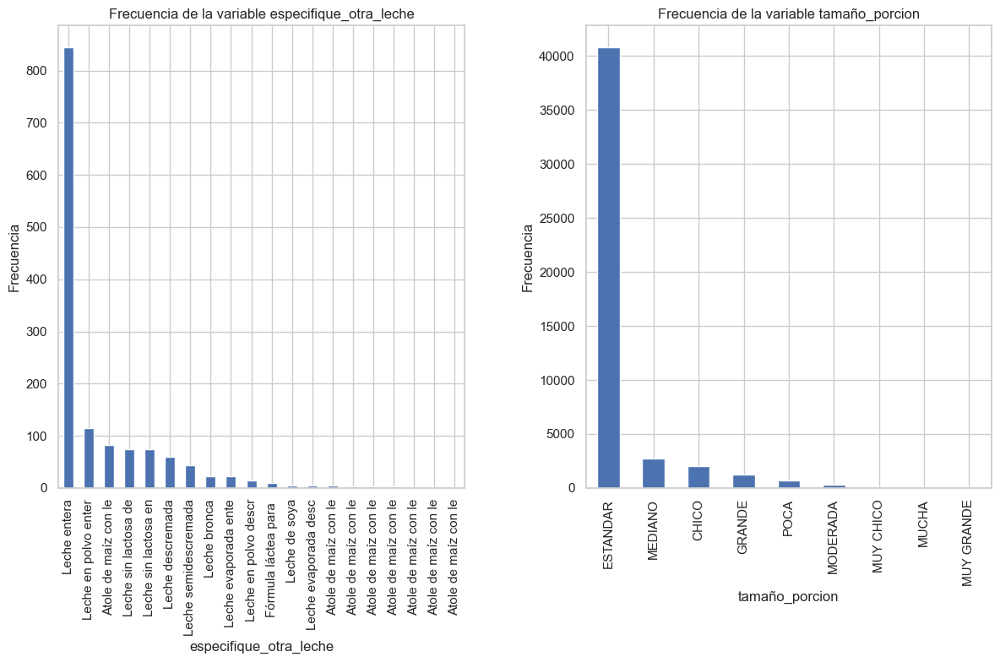

In [57]:
# Distribucion del conjunto de datos de alimentos de las variables categoricas de baja cardinalidad

columnas_categoricas = [  'especifique_otra_leche', 'tamaño_porcion']

fig, axs = plt.subplots(1, 2, figsize=(12, 8))  
axs = axs.flatten()

for i, columna in enumerate(columnas_categoricas):
    frecuencias = df_food_general[columna].value_counts()
    frecuencias.index = frecuencias.index.str.slice(0, 20) 
    frecuencias.plot(kind='bar', ax=axs[i])  
    axs[i].set_xlabel(columna)
    axs[i].set_ylabel('Frecuencia')
    axs[i].set_title(f'Frecuencia de la variable {columna}')

plt.tight_layout()
plt.subplots_adjust(hspace=1, wspace=0.3)
plt.show()

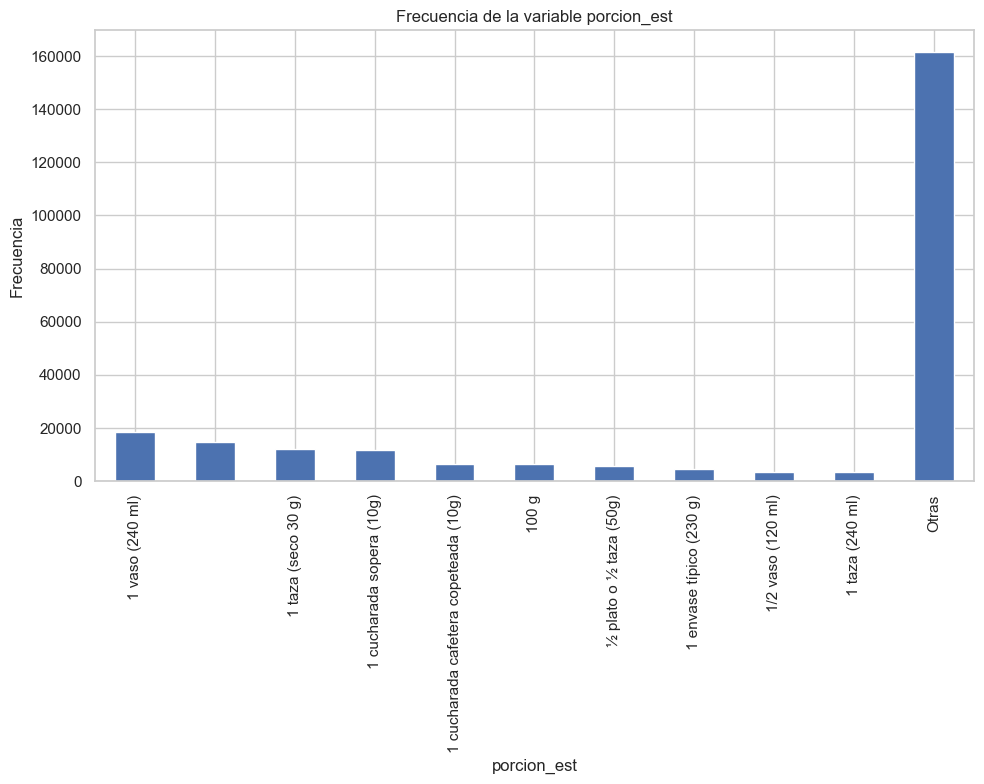

In [58]:
# Distribucion del conjunto de datos de alimentos de las variables categoricas de alta cardinalidad
# correccion de subplot sobrante abajo por Carlos J

columnas_categoricas = [  'porcion_est' ]

for columna in columnas_categoricas:
    frecuencias = df_food_general[columna].value_counts()
    top_10_frecuencias = frecuencias.nlargest(10)
    otras_frecuencias = frecuencias[~frecuencias.index.isin(top_10_frecuencias.index)].sum()
    top_10_frecuencias["Otras"] = otras_frecuencias
    top_10_frecuencias.plot(kind='bar', figsize=(10, 8))  
    plt.xlabel(columna)
    plt.ylabel('Frecuencia')
    plt.title(f'Frecuencia de la variable {columna}')
    plt.tight_layout()
    plt.show()


Como se puede observar en las graficas de la caja de arriba, las variables de alta cardinalidad son: porcion_est.

Las variables porcion_est no son relevantes para los objetivos del estudio y por lo tanto las podemos ignorar al momento de realizar el modelo. 

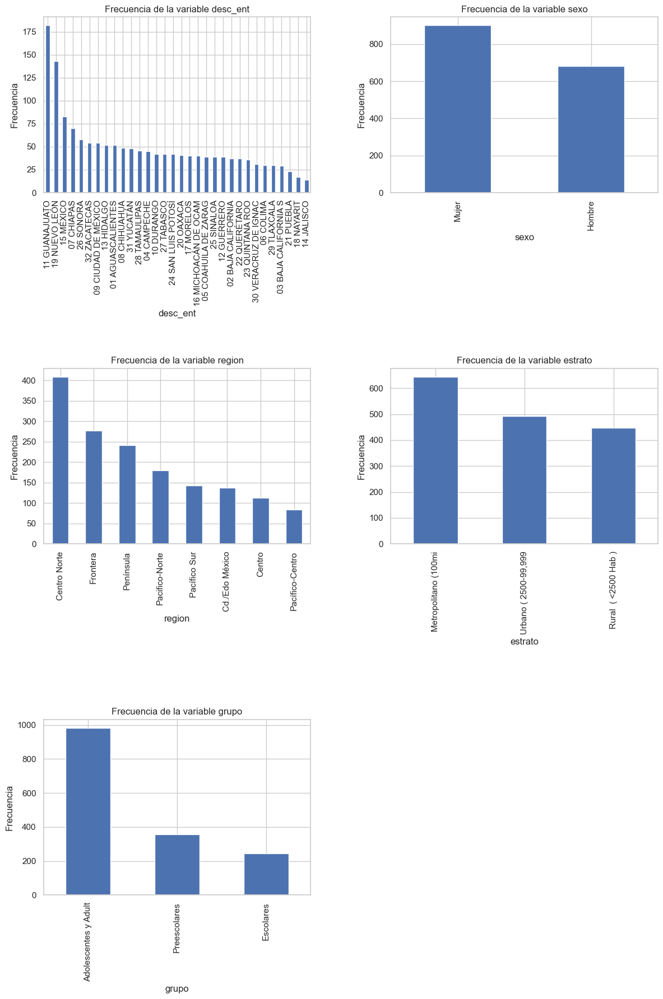

In [59]:
# Distribucion del conjunto de datos de demograficos de baja cardinalidad

columnas_categoricas = ['desc_ent', 'sexo', 'region', 'estrato', 'grupo']

fig, axs = plt.subplots(3, 2, figsize=(12, 18))  
axs = axs.flatten()

for i, columna in enumerate(columnas_categoricas):
    frecuencias = df_dem_general[columna].value_counts()
    frecuencias.index = frecuencias.index.str.slice(0, 20) 
    frecuencias.plot(kind='bar', ax=axs[i])  
    axs[i].set_xlabel(columna)
    axs[i].set_ylabel('Frecuencia')
    axs[i].set_title(f'Frecuencia de la variable {columna}')

# Eliminar el último subplot vacío
fig.delaxes(axs[-1])

plt.tight_layout()
plt.subplots_adjust(hspace=1, wspace=0.3)
plt.show()

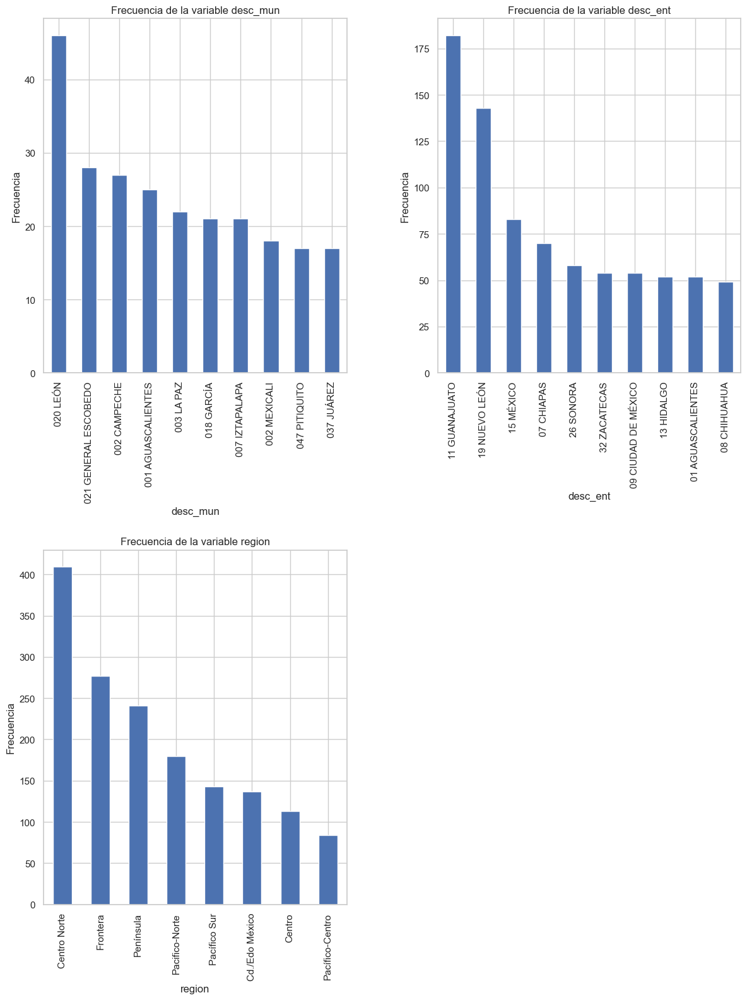

In [60]:
# Distribucion del conjunto de datos de demograficos de alta cardinalidad

columnas_categoricas = [ 'desc_mun', 'desc_ent', 'region']

fig, axs = plt.subplots(2, 2, figsize=(12, 16))  
axs = axs.flatten()

for i, columna in enumerate(columnas_categoricas):
    frecuencias = df_dem_general[columna].value_counts()
    top_10_frecuencias = frecuencias.nlargest(10)
    otras_frecuencias = frecuencias[~frecuencias.index.isin(top_10_frecuencias.index)].sum()
    # top_10_frecuencias["Otras"] = otras_frecuencias
    top_10_frecuencias.plot(kind='bar', ax=axs[i])  
    axs[i].set_xlabel(columna)
    axs[i].set_ylabel('Frecuencia')
    axs[i].set_title(f'Frecuencia de la variable {columna}')
fig.delaxes(axs[-1])
plt.tight_layout()
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.show()

Como se puede observar en las graficas de la caja de arriba, las variables de alta cardinalidad son: desc_mun y upm.

Las variables desc_mun, upm y porcion_est no son relevantes para los objetivos del estudio y por lo tanto las podemos ignorar al momento de realizar el modelo. 



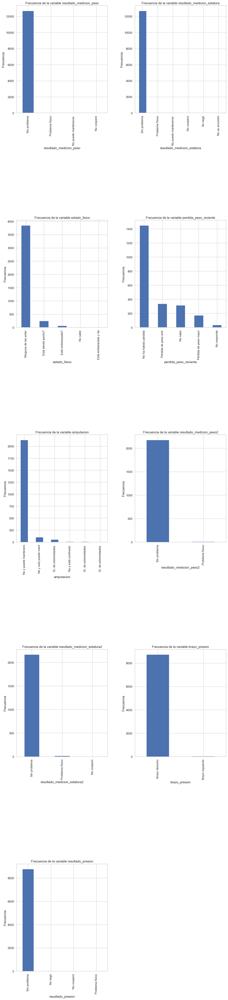

In [61]:
# Distribucion del conjunto de datos de antrompometricos de baja cardinalidad

columnas_categoricas = [ 'resultado_medicion_peso', 'resultado_medicion_estatura', 'estado_fisico', 'perdida_peso_reciente', 'amputacion',  'resultado_medicion_peso2', 'resultado_medicion_estatura2',  'brazo_presion', 'resultado_presion']


fig, axs = plt.subplots(5, 2, figsize=(12, 52))  
axs = axs.flatten()

for i, columna in enumerate(columnas_categoricas):
    frecuencias = df_antroph_data[columna].value_counts()
    frecuencias.index = frecuencias.index.str.slice(0, 20) 
    frecuencias.plot(kind='bar', ax=axs[i])  
    axs[i].set_xlabel(columna)
    axs[i].set_ylabel('Frecuencia')
    axs[i].set_title(f'Frecuencia de la variable {columna}')
fig.delaxes(axs[-1])
plt.tight_layout()
plt.subplots_adjust(hspace=1, wspace=0.3)
plt.show()

# Ingeniería de características

### Datos demográficos

In [62]:
df_dem_general.head()

,folio_integrante,resultado_ent1,resultado_ent2,resultado_ent3,resultado_ent4,desc_ent,desc_mun,region,edad,sexo,ponderador,estrato,grupo
0,2022_01001001_01,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,51,Mujer,8717.185479,Metropolitano (100mil y + Hab),Adolescentes y Adultos
1,2022_01001028_04,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,26,Mujer,51475.173556,Metropolitano (100mil y + Hab),Adolescentes y Adultos
2,2022_01001034_03,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,12,Hombre,16477.855758,Metropolitano (100mil y + Hab),Adolescentes y Adultos
3,2022_01001041_04,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,12,Hombre,11801.483710,Metropolitano (100mil y + Hab),Adolescentes y Adultos
4,2022_01001042_01,1,0,0,0,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,62,Mujer,7032.174356,Metropolitano (100mil y + Hab),Adolescentes y Adultos


Las columnas resultado_ent1, resultado_ent2, resultado_ent3, resultado_ent4 hacen referencia al resultado de las entrevistas, indicando cualquier valor diferente de 1 o 0 que la entrevista presentó una novedad que impide su análisis. Por esta razón se creará una columna adicional que valide esto e indique si la encuesta es valida o no, y se eliminarán estas 4 columnas.


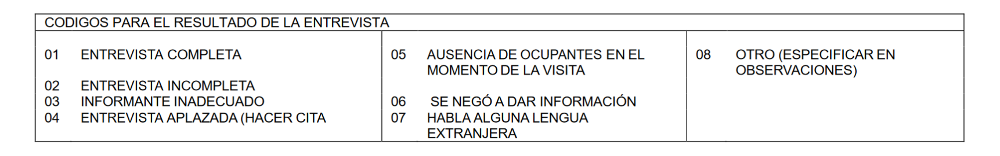

In [63]:
df_dem_final = df_dem_general.copy()
df_dem_final['resultado_general_entrevista'] = df_dem_final[['resultado_ent1', 'resultado_ent2', 
                                            'resultado_ent3', 'resultado_ent4']].apply(
    lambda x: 1 if (x <= 1).all() else 0, axis=1
)
df_dem_final.drop(columns=['resultado_ent1', 'resultado_ent2', 'resultado_ent3', 'resultado_ent4'], inplace=True)
df_dem_final.head()

,folio_integrante,desc_ent,desc_mun,region,edad,sexo,ponderador,estrato,grupo,resultado_general_entrevista
0,2022_01001001_01,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,51,Mujer,8717.185479,Metropolitano (100mil y + Hab),Adolescentes y Adultos,1
1,2022_01001028_04,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,26,Mujer,51475.173556,Metropolitano (100mil y + Hab),Adolescentes y Adultos,1
2,2022_01001034_03,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,12,Hombre,16477.855758,Metropolitano (100mil y + Hab),Adolescentes y Adultos,1
3,2022_01001041_04,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,12,Hombre,11801.483710,Metropolitano (100mil y + Hab),Adolescentes y Adultos,1
4,2022_01001042_01,01 AGUASCALIENTES,001 AGUASCALIENTES,Centro Norte,62,Mujer,7032.174356,Metropolitano (100mil y + Hab),Adolescentes y Adultos,1


Respecto a las variables geográficas decidimos trabajar únicamente con la región, dado que el objetivo del estudio es generar conclusiones respecto al consumo de alimentos y su relación con la salud de las personas medida desde los datos antropométricos, por lo que concluimos que con esta variable nos basta para incluir el aspecto geográfico reduciendo la dimensionalidad que nos podrían causar el municipio y el estado, lo cual se analizó en la etapa de EDA.

In [64]:
df_dem_final.drop(columns=['desc_ent','desc_mun'], inplace=True)

<AxesSubplot: >

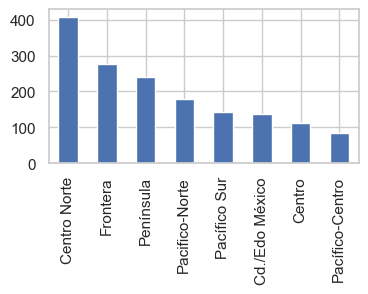

In [65]:
df_dem_final['region'].value_counts().plot(kind='bar', figsize=(4, 2))

In [66]:
list_cat_features_dem = ['region', 'sexo', 'estrato']
df_dem_final = apply_one_hot_encoding(df_dem_final, list_cat_features_dem)
df_dem_final.head()

,folio_integrante,edad,ponderador,grupo,resultado_general_entrevista,region_Centro,region_Centro Norte,region_Frontera,region_Pacifico-Norte,region_Pacífico Sur,region_Pacífico-Centro,region_Península,sexo_Mujer,estrato_Rural ( <2500 Hab ),"estrato_Urbano ( 2500-99,999 Hab)"
0,2022_01001001_01,51,8717.185479,Adolescentes y Adultos,1,0,1,0,0,0,0,0,1,0,0
1,2022_01001028_04,26,51475.173556,Adolescentes y Adultos,1,0,1,0,0,0,0,0,1,0,0
2,2022_01001034_03,12,16477.855758,Adolescentes y Adultos,1,0,1,0,0,0,0,0,0,0,0
3,2022_01001041_04,12,11801.483710,Adolescentes y Adultos,1,0,1,0,0,0,0,0,0,0,0
4,2022_01001042_01,62,7032.174356,Adolescentes y Adultos,1,0,1,0,0,0,0,0,1,0,0


Las variables de folio y grupo no se tratarán, dado que solo se usarán para cruces y filtrado posterior.

### Datos antropométricos

In [67]:
df_antroph_final = df_antroph_data.copy()
df_antroph_final.head()

,folio_int,peso_medicion1,peso_medicion2,resultado_medicion_peso,estatura_medicion1,estatura_medicion2,resultado_medicion_estatura,estado_fisico,meses_embarazo,cintura_medicion1,...,cintura_medicion4,resultado_medicion_cintura,presion_sistolica1,presion_diastolica1,presion_sistolica2,presion_diastolica2,presion_sistolica3,presion_diastolica3,brazo_presion,resultado_presion
0,2022_01001001_01,69.30,69.40,Sin problema,141.6,141.2,Sin problema,NaN,NaN,110.1,...,NaN,NaN,115.0,85.0,119.0,80.0,124.0,78.0,Brazo derecho,Sin problema
1,2022_01001001_02,44.60,44.85,Sin problema,151.5,151.1,Sin problema,Ninguna de las anteriores,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2022_01001003_02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,100.4,Sin problema,130.0,78.0,123.0,74.0,123.0,76.0,Brazo derecho,Sin problema
3,2022_01001003_03,110.35,110.25,Sin problema,156.8,156.8,Sin problema,Ninguna de las anteriores,NaN,132.1,...,NaN,NaN,87.0,50.0,93.0,58.0,89.0,49.0,Brazo derecho,Sin problema
4,2022_01001003_06,33.50,33.55,Sin problema,151.8,152.2,Sin problema,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Vemos que tenemos varias mediciones de algunas variables, por ejemplo el peso y la estatura. Debido a esto, vamos a promediar estas mediciones para obtener un solo valor por persona.


In [68]:
df_antroph_final['peso'] = df_antroph_final[['peso_medicion1', 'peso_medicion2', 'peso_medicion3', 'peso_medicion4']].mean(axis=1,skipna=True)
df_antroph_final['estatura'] = df_antroph_final[['estatura_medicion1', 'estatura_medicion2', 'estatura_medicion3', 'estatura_medicion4']].mean(axis=1,skipna=True)
df_antroph_final['cintura'] = df_antroph_final[['cintura_medicion1', 'cintura_medicion2', 'cintura_medicion3', 'cintura_medicion4']].mean(axis=1)
df_antroph_final['presion_sistolica'] = df_antroph_final[['presion_sistolica1', 'presion_sistolica2', 'presion_sistolica3']].mean(axis=1,skipna=True)
df_antroph_final['presion_diastolica'] = df_antroph_final[['presion_diastolica1', 'presion_diastolica2', 'presion_diastolica3']].mean(axis=1,skipna=True)
df_antroph_final.drop(columns=['peso_medicion1', 'peso_medicion2', 'peso_medicion3', 'peso_medicion4', 'estatura_medicion1', 'estatura_medicion2', 'estatura_medicion3', 'estatura_medicion4', 'cintura_medicion1', 'cintura_medicion2', 'cintura_medicion3', 'cintura_medicion4', 'presion_sistolica1', 'presion_sistolica2', 'presion_sistolica3', 'presion_diastolica1', 'presion_diastolica2', 'presion_diastolica3'], inplace=True)
df_antroph_final.head()

,folio_int,resultado_medicion_peso,resultado_medicion_estatura,estado_fisico,meses_embarazo,resultado_medicion_cintura,perdida_peso_reciente,amputacion,resultado_medicion_peso2,resultado_medicion_estatura2,resultado_medicion_cintura,brazo_presion,resultado_presion,peso,estatura,cintura,presion_sistolica,presion_diastolica
0,2022_01001001_01,Sin problema,Sin problema,NaN,NaN,Sin problema,NaN,NaN,NaN,NaN,NaN,Brazo derecho,Sin problema,69.350,141.40,109.95,119.333333,81.000000
1,2022_01001001_02,Sin problema,Sin problema,Ninguna de las anteriores,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44.725,151.30,NaN,NaN,NaN
2,2022_01001003_02,NaN,NaN,NaN,NaN,NaN,No ha habido pérdida de peso,No y puede mantenerse de pie,Sin problema,Sin problema,Sin problema,Brazo derecho,Sin problema,73.250,165.05,100.25,125.333333,76.000000
3,2022_01001003_03,Sin problema,Sin problema,Ninguna de las anteriores,NaN,Sin problema,NaN,NaN,NaN,NaN,NaN,Brazo derecho,Sin problema,110.300,156.80,132.45,89.666667,52.333333
4,2022_01001003_06,Sin problema,Sin problema,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,33.525,152.00,NaN,NaN,NaN


<AxesSubplot: >

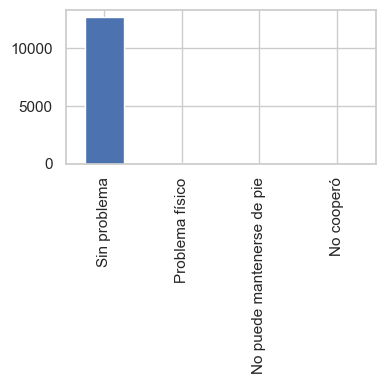

In [69]:
df_antroph_final['resultado_medicion_peso'].value_counts().plot(kind='bar', figsize=(4, 2))

<AxesSubplot: >

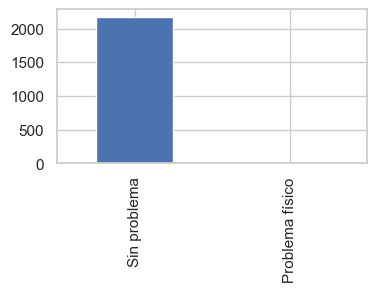

In [70]:
df_antroph_final['resultado_medicion_peso2'].value_counts().plot(kind='bar', figsize=(4, 2))

<AxesSubplot: >

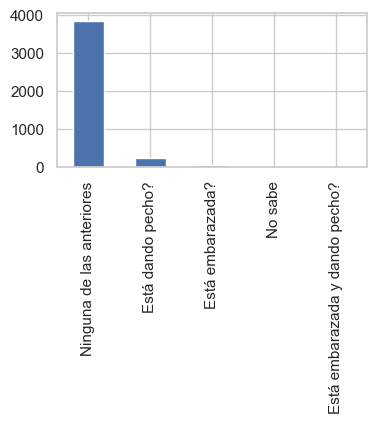

In [71]:
df_antroph_final['estado_fisico'].value_counts().plot(kind='bar', figsize=(4, 2))

In [72]:
df_antroph_final['amputacion'].value_counts()

No y puede mantenerse de pie                  2133
No y solo puede mantenerse sentado             104
Sí, de extremidades superiores y camina         56
No y está confinado a una cama                  11
Sí, de extremidades inferiores                   9
Sí, de extremidades superiores y no camina       3
Name: amputacion, dtype: int64

Dado que algunas de las encuestas presentaron novedades en la medición de los pesos o la estatura, por ejemplo porque las personas no cooperaron, vamos a eliminar estos registros y dejar únicamente mediciones válidas.

Por otro lado, también eliminaremos las personas embarazadas o dando pecho, dado que tanto su peso como su consumo de alimentos va a estar alterado.
También las personas que hayan sufrido amputaciones, dado que su peso será irregular.

In [73]:
list_columns_filter = ['resultado_medicion_peso', 'resultado_medicion_estatura', 'estado_fisico', 'resultado_medicion_cintura', 'amputacion', 
                       'resultado_medicion_peso2', 'resultado_medicion_estatura2', 'resultado_presion','meses_embarazo']
df_antroph_final = df_antroph_final[
    ((df_antroph_final['resultado_medicion_peso'] == 'Sin problema') | df_antroph_final['resultado_medicion_peso'].isna()) &
    ((df_antroph_final['resultado_medicion_estatura'] == 'Sin problema') | df_antroph_final['resultado_medicion_estatura'].isna()) &
    ((df_antroph_final['estado_fisico'] == 'Ninguna de las anteriores') | df_antroph_final['estado_fisico'].isna()) &
    (~df_antroph_final['amputacion'].str.contains('Sí', na=False)) &
    ((df_antroph_final['resultado_medicion_peso2'] == 'Sin problema') | df_antroph_final['resultado_medicion_peso2'].isna()) &
    ((df_antroph_final['resultado_medicion_estatura2'] == 'Sin problema') | df_antroph_final['resultado_medicion_estatura2'].isna()) &
    ((df_antroph_final['resultado_presion'] == 'Sin problema') | df_antroph_final['resultado_presion'].isna()) 
    
]
df_antroph_final.drop(columns=list_columns_filter, inplace=True)
df_antroph_final.head()

,folio_int,perdida_peso_reciente,brazo_presion,peso,estatura,cintura,presion_sistolica,presion_diastolica
0,2022_01001001_01,NaN,Brazo derecho,69.350,141.40,109.95,119.333333,81.000000
1,2022_01001001_02,NaN,NaN,44.725,151.30,NaN,NaN,NaN
2,2022_01001003_02,No ha habido pérdida de peso,Brazo derecho,73.250,165.05,100.25,125.333333,76.000000
3,2022_01001003_03,NaN,Brazo derecho,110.300,156.80,132.45,89.666667,52.333333
4,2022_01001003_06,NaN,NaN,33.525,152.00,NaN,NaN,NaN


Ahora analizaremos la correlación entre las variables numéricas que nos quedan en el conjunto de datos de antropometría.


Las 10 correlaciones más altas (en magnitud absoluta) usando Pearson:

estatura y peso: 0.84
cintura y peso: 0.80
presion_diastolica y presion_sistolica: 0.63
presion_diastolica y peso: 0.27
presion_diastolica y cintura: 0.26
presion_sistolica y cintura: 0.22
presion_sistolica y peso: 0.11
cintura y estatura: 0.11
presion_diastolica y estatura: 0.10
presion_sistolica y estatura: 0.00



Mostrando la matriz de dispersión (pair plot) entre las variables...



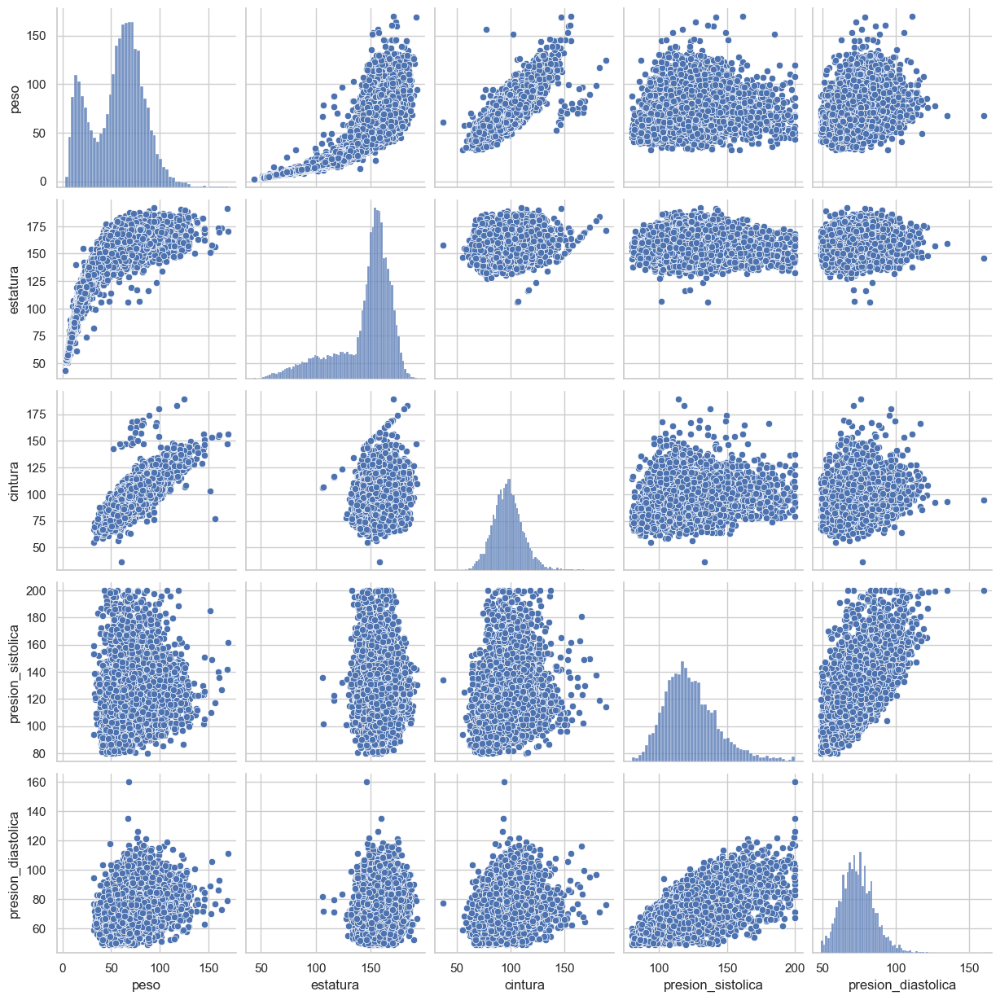

,peso,estatura,cintura,presion_sistolica,presion_diastolica
peso,1.000000,0.835028,0.803112,0.111250,0.273429
estatura,0.835028,1.000000,0.110373,0.003003,0.102600
cintura,0.803112,0.110373,1.000000,0.224340,0.259554
presion_sistolica,0.111250,0.003003,0.224340,1.000000,0.628118
presion_diastolica,0.273429,0.102600,0.259554,0.628118,1.000000


In [74]:
# Ahora analizaremos la correlación entre las variables numéricas que nos quedan en el conjunto de datos de antropometría.
list_numeric_columns_antroph = ['peso', 'estatura', 'cintura', 'presion_sistolica', 'presion_diastolica']
analyze_correlation(df_antroph_final, list_numeric_columns_antroph, 'pearson')

Debido a que la estatura y el peso están estrechamente relacionadas y por si solas no nos dicen mucho sobre la salud de una persona, procederemos a calcular el índice de masa corporal en su lugar.

In [75]:
## CAlculo de indice de masa corporal
df_antroph_final['imc'] = df_antroph_final['peso'] / (df_antroph_final['estatura'] / 100)**2
df_antroph_final.drop(columns=['peso', 'estatura'], inplace=True)
df_antroph_final.head()

,folio_int,perdida_peso_reciente,brazo_presion,cintura,presion_sistolica,presion_diastolica,imc
0,2022_01001001_01,NaN,Brazo derecho,109.95,119.333333,81.000000,34.685475
1,2022_01001001_02,NaN,NaN,NaN,NaN,NaN,19.537658
2,2022_01001003_02,No ha habido pérdida de peso,Brazo derecho,100.25,125.333333,76.000000,26.889119
3,2022_01001003_03,NaN,Brazo derecho,132.45,89.666667,52.333333,44.862492
4,2022_01001003_06,NaN,NaN,NaN,NaN,NaN,14.510474


Respecto a la presion arterial, haremos discretización de las variables presion_sistolica y presion_diastolica en base a los valores de referencia de la OMS.

In [76]:
def discretize_blood_pressure(df):
    """
    Discretiza las lecturas de presión arterial en categorías de salud
    basadas en las directrices de la OMS.

    Args:
    - df: DataFrame con columnas 'sistolica' y 'diastolica'.

    Returns:
    - DataFrame con una columna adicional 'BP_Category'.
    """
    
    def categorize_blood_pressure(row):
        systolic = row['presion_sistolica']
        diastolic = row['presion_diastolica']
        
        if systolic < 120 and diastolic < 80:
            return 'Normal'
        elif 120 <= systolic < 130 and diastolic < 80:
            return 'Elevada'
        elif 130 <= systolic < 140 or (systolic < 140 and 80 <= diastolic < 90):
            return 'Hipertensión en etapa 1'
        elif systolic >= 140 or diastolic >= 90:
            return 'Hipertensión en etapa 2'
        elif systolic > 180 or diastolic > 120:
            return 'Crisis hipertensiva'
        else:
            return 'Desconocido'  # Manejo de casos no conocidos

    # Aplicar la función de categorización a cada fila del DataFrame
    df['clase_presion'] = df.apply(categorize_blood_pressure, axis=1)
    
    return df

In [77]:
df_antroph_final = discretize_blood_pressure(df_antroph_final)
df_antroph_final.drop(columns=['presion_sistolica', 'presion_diastolica'], inplace=True)
df_antroph_final.head()

,folio_int,perdida_peso_reciente,brazo_presion,cintura,imc,clase_presion
0,2022_01001001_01,NaN,Brazo derecho,109.95,34.685475,Hipertensión en etapa 1
1,2022_01001001_02,NaN,NaN,NaN,19.537658,Desconocido
2,2022_01001003_02,No ha habido pérdida de peso,Brazo derecho,100.25,26.889119,Elevada
3,2022_01001003_03,NaN,Brazo derecho,132.45,44.862492,Normal
4,2022_01001003_06,NaN,NaN,NaN,14.510474,Desconocido


Finalmente, realizaremos el encoding de las variables categóricas en el conjunto de datos de antropometría.

In [78]:

list_cat_features_antroph = ['perdida_peso_reciente','brazo_presion']
df_antroph_final = apply_one_hot_encoding(df_antroph_final, list_cat_features_antroph)
df_antroph_final.head()

,folio_int,cintura,imc,clase_presion,perdida_peso_reciente_No responde,perdida_peso_reciente_No sabe,perdida_peso_reciente_Pérdida de peso entre 1 y 3 kg,perdida_peso_reciente_Pérdida de peso mayor a 3 kg,brazo_presion_Brazo izquierdo
0,2022_01001001_01,109.95,34.685475,Hipertensión en etapa 1,0,0,0,0,0
1,2022_01001001_02,NaN,19.537658,Desconocido,0,0,0,0,0
2,2022_01001003_02,100.25,26.889119,Elevada,0,0,0,0,0
3,2022_01001003_03,132.45,44.862492,Normal,0,0,0,0,0
4,2022_01001003_06,NaN,14.510474,Desconocido,0,0,0,0,0


<AxesSubplot: >

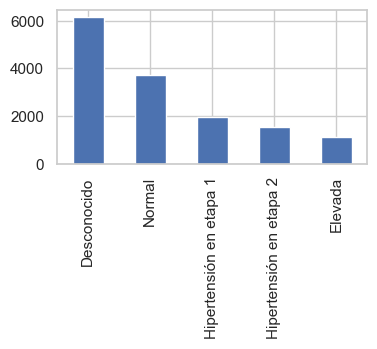

In [79]:
df_antroph_final['clase_presion'].value_counts().plot(kind='bar', figsize=(4, 2))

A continuación se realiza la codificación ordinal de la columna "Clase presión" dado que sus categorías tienen un orden lógico.

In [80]:
categories = ['Normal', 'Elevada', 'Hipertensión en etapa 1', 'Hipertensión en etapa 2', 'Crisis hipertensiva', 'Desconocido']
encoder = OrdinalEncoder(categories=[categories])
df_antroph_final['clase_presion'] = encoder.fit_transform(df_antroph_final[['clase_presion']]).astype(int)
df_antroph_final.head()


,folio_int,cintura,imc,clase_presion,perdida_peso_reciente_No responde,perdida_peso_reciente_No sabe,perdida_peso_reciente_Pérdida de peso entre 1 y 3 kg,perdida_peso_reciente_Pérdida de peso mayor a 3 kg,brazo_presion_Brazo izquierdo
0,2022_01001001_01,109.95,34.685475,2,0,0,0,0,0
1,2022_01001001_02,NaN,19.537658,5,0,0,0,0,0
2,2022_01001003_02,100.25,26.889119,1,0,0,0,0,0
3,2022_01001003_03,132.45,44.862492,0,0,0,0,0,0
4,2022_01001003_06,NaN,14.510474,5,0,0,0,0,0


# Cálculo del DQI-I

### Importación de librerías

## Calculo del consumo semanal alimentos y sus componentes

<AxesSubplot: >

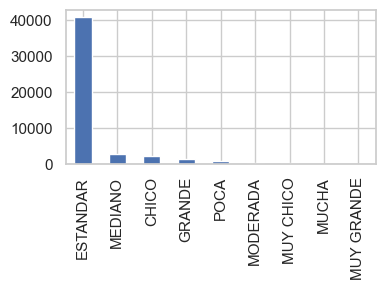

In [81]:
df_base_dqi = df_food_general.copy()
df_base_dqi['tamaño_porcion'].value_counts().plot(kind='bar', figsize=(4, 2))

A continuacion se transforman los valores categóricos de los tamaños de las porciones a valores numéricos, según lo indicado por la Dra. Chuck.

<AxesSubplot: >

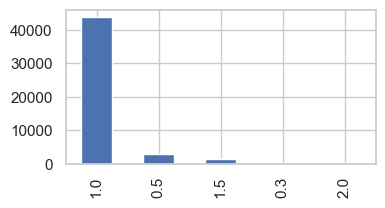

In [82]:
dict_tamano_porcion = {'ESTANDAR':1, 'CHICO':0.5, 'GRANDE':1.5, 'MUY GRANDE':2, 'MEDIANO':1, 'MUY CHICO':0.3,'MUCHA':1.5,'POCA':0.5,'MODERADA':1}
df_base_dqi['tamaño_porcion_num'] = df_base_dqi['tamaño_porcion'].map(dict_tamano_porcion)
df_base_dqi['tamaño_porcion_num'].value_counts().plot(kind='bar', figsize=(4, 2))

In [83]:
## Relleando valores faltantes
df_base_dqi[['dias_consumo', 'veces_al_dia', 'num_porciones', 'tamaño_porcion_num']] = df_base_dqi[['dias_consumo', 'veces_al_dia', 'num_porciones', 'tamaño_porcion_num']].fillna(0)
## Calculo consumo semanal
df_base_dqi['consumo_semanal'] = df_base_dqi['dias_consumo'] * df_base_dqi['veces_al_dia'] * df_base_dqi['num_porciones']*df_base_dqi['tamaño_porcion_num']
# histograma del consumo semanal
fig = px.histogram(df_base_dqi, x='consumo_semanal', nbins=200, title='Histograma del consumo semanal de alimentos')
fig.show()


Hay personas que reportan un consumo semanal de alimentos extremadamente alto, lo cual podría reflejar datos atípicos dado que una persona no podría consumir 350 veces un alimento. Esto se tratará al momento de construir el modelo.

In [84]:
df_componentes = pd.read_excel('./Data/OtrasFuentes/nutritional_data.xlsx')
df_componentes.head()

,alimento,porcion_est,porc_est_gm_ml,nombre_bam,calorias_vacias,porcion_bam,energ_kcal,carbohydrt,lipid_tot,protein,...,vit_b12,vit_a_rae,vit_e,vit_d_iu,vit_k,fa_sat,fa_mono,fa_poly,chole,sodio
0,Leche Liconsa,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,49.04,4.75,2.36,3.05,...,0.11,48.60,0.00,19.20,0.00,0.800,0.000,0.00,0.000,46.5
1,Otra leche opción A,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,49.04,4.75,2.36,3.05,...,0.11,48.60,0.00,19.20,0.00,0.800,0.000,0.00,0.000,38.0
2,Otra leche opción B,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,49.04,4.75,2.36,3.05,...,0.11,48.60,0.00,19.20,0.00,0.800,0.000,0.00,0.000,38.0
3,Otra leche opción C,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,49.04,4.75,2.36,3.05,...,0.11,48.60,0.00,19.20,0.00,0.800,0.000,0.00,0.000,38.0
4,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),240,"LECHE CON CHOCOLATE, PREPARACION ESTANDARIZADA",1,100,90.08,12.63,3.05,3.10,...,0.41,171.67,0.64,20.14,0.36,1.952,1.002,0.24,9.049,60.0


Los valores del BAM están sobre porciones de 100 gramos o 100 ml, por lo cual debemos convertir los valores a la porción indicada en la encuesta de alimentos

In [85]:
# convertir valores según porciones
df_componentes['relacion_porcion'] = df_componentes['porc_est_gm_ml'].div(df_componentes['porcion_bam'])
df_componentes.iloc[:, 6:-1] = df_componentes.iloc[:, 6:-1].mul(df_componentes['relacion_porcion'], axis=0)
df_componentes.head()

,alimento,porcion_est,porc_est_gm_ml,nombre_bam,calorias_vacias,porcion_bam,energ_kcal,carbohydrt,lipid_tot,protein,...,vit_a_rae,vit_e,vit_d_iu,vit_k,fa_sat,fa_mono,fa_poly,chole,sodio,relacion_porcion
0,Leche Liconsa,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,117.696,11.400,5.664,7.32,...,116.640,0.000,46.080,0.000,1.9200,0.0000,0.000,0.0000,111.6,2.4
1,Otra leche opción A,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,117.696,11.400,5.664,7.32,...,116.640,0.000,46.080,0.000,1.9200,0.0000,0.000,0.0000,91.2,2.4
2,Otra leche opción B,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,117.696,11.400,5.664,7.32,...,116.640,0.000,46.080,0.000,1.9200,0.0000,0.000,0.0000,91.2,2.4
3,Otra leche opción C,1 vaso (240 ml),240,LECHE LICONSA PROMEDIO,0,100,117.696,11.400,5.664,7.32,...,116.640,0.000,46.080,0.000,1.9200,0.0000,0.000,0.0000,91.2,2.4
4,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),240,"LECHE CON CHOCOLATE, PREPARACION ESTANDARIZADA",1,100,216.192,30.312,7.320,7.44,...,412.008,1.536,48.336,0.864,4.6848,2.4048,0.576,21.7176,144.0,2.4


Ahora unimos el df de componentes con el de alimentos

In [86]:
# unir los datos de alimentos con los datos nutricionales
df_base_dqi = df_base_dqi.merge(df_componentes, left_on='alimento', right_on='alimento', how='left')
df_base_dqi.isnull().sum()


folio_integrante               0
alimento                       0
porcion_est_x                  0
dias_consumo                   0
especifique_otra_leche    247654
veces_al_dia                   0
tamaño_porcion            201000
num_porciones                  0
tamaño_porcion_num             0
consumo_semanal                0
porcion_est_y                  0
porc_est_gm_ml                 0
nombre_bam                     0
calorias_vacias                0
porcion_bam                    0
energ_kcal                     0
carbohydrt                     0
lipid_tot                      0
protein                        0
fiber_td                       0
calcium                        0
iron                           0
ironhem                        0
ironnohem                      0
zinc                           0
vit_c                          0
thiamin                        0
riboflavin                     0
niacin                         0
panto_acid                     0
vit_b6    

Ahora calculamos los componentes nutricionales según el consumo semanal de cada alimento.

In [87]:
# Ahora calculamos los componentes nutricionales según el consumo semanal de cada alimento.
df_base_dqi.iloc[:, 20:-1] = df_base_dqi.iloc[:, 20:-1].mul(df_base_dqi['consumo_semanal'], axis=0)
df_base_dqi.head()

,folio_integrante,alimento,porcion_est_x,dias_consumo,especifique_otra_leche,veces_al_dia,tamaño_porcion,num_porciones,tamaño_porcion_num,consumo_semanal,...,vit_a_rae,vit_e,vit_d_iu,vit_k,fa_sat,fa_mono,fa_poly,chole,sodio,relacion_porcion
0,2022_01001001_01,Leche Liconsa,1 vaso (240 ml),0.0,NaN,0.0,NaN,0.0,0.0,0.0,...,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,2.4
1,2022_01001001_01,Otra leche opción A,1 vaso (240 ml),7.0,Leche entera,2.0,ESTANDAR,1.0,1.0,14.0,...,1632.96,0.0,645.12,0.0,26.88,0.0,0.0,0.0,1276.8,2.4
2,2022_01001001_01,Otra leche opción B,1 vaso (240 ml),0.0,NaN,0.0,NaN,0.0,0.0,0.0,...,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,2.4
3,2022_01001001_01,Otra leche opción C,1 vaso (240 ml),0.0,NaN,0.0,NaN,0.0,0.0,0.0,...,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,2.4
4,2022_01001001_01,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),0.0,NaN,0.0,NaN,0.0,0.0,0.0,...,0.00,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,2.4


## Calculo de los componentes del DQI

### Calculo del componente de Balance

In [88]:
## calcular los nutrientes consumidos por persona
list_nutrients  = [
                        "energ_kcal", "carbohydrt", "lipid_tot", "protein", "fiber_td",
                        "calcium", "iron", "ironhem", "ironnohem", "zinc",
                        "vit_c", "thiamin", "riboflavin", "niacin", "panto_acid",
                        "vit_b6", "folic_acid", "food_folate", "folate_dfe", "vit_b12",
                        "vit_a_rae", "vit_e", "vit_d_iu", "vit_k", "fa_sat",
                        "fa_mono", "fa_poly", "chole", "sodio"
                    ]
df_nutrients = df_base_dqi.groupby('folio_integrante').sum()[list_nutrients]
df_nutrients.head()


,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,vit_b12,vit_a_rae,vit_e,vit_d_iu,vit_k,fa_sat,fa_mono,fa_poly,chole,sodio
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,7.7740,3269.94550,15.570750,855.3610,396.57300,110.002815,87.380040,47.409360,436.311900,5091.5500
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,18.1695,5801.64000,16.814090,1630.9250,134.32660,124.947350,73.312730,27.450590,1171.179550,8193.4400
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,7.5615,1553.66600,9.025000,565.9590,66.69300,115.686740,84.363340,37.248810,1014.657600,5336.4200
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,17.8673,7965.16950,45.531000,1006.2060,984.85625,168.886327,165.511002,78.111185,2838.916150,11323.7060
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,8.9255,2654.57385,23.628128,647.1865,441.90800,64.196774,77.498861,34.315620,2032.703262,6629.1974


A continuación se calcula el "Macronutrient ratio"

In [89]:
# Calcular macronutrients ratio por macronutriente
df_nutrients['carbohydrt_ratio'] = (df_nutrients['carbohydrt'] *4).div(df_nutrients['carbohydrt']*4 + df_nutrients['lipid_tot']*9 + df_nutrients['protein']*4)
df_nutrients['lipid_tot_ratio'] = (df_nutrients['lipid_tot'] *9).div(df_nutrients['carbohydrt']*4 + df_nutrients['lipid_tot']*9 + df_nutrients['protein']*4)
df_nutrients['protein_ratio'] = (df_nutrients['protein'] *4).div(df_nutrients['carbohydrt']*4 + df_nutrients['lipid_tot']*9 + df_nutrients['protein']*4)
df_nutrients.head()


,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,vit_d_iu,vit_k,fa_sat,fa_mono,fa_poly,chole,sodio,carbohydrt_ratio,lipid_tot_ratio,protein_ratio
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,855.3610,396.57300,110.002815,87.380040,47.409360,436.311900,5091.5500,0.485939,0.368031,0.146030
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,1630.9250,134.32660,124.947350,73.312730,27.450590,1171.179550,8193.4400,0.483158,0.370418,0.146424
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,565.9590,66.69300,115.686740,84.363340,37.248810,1014.657600,5336.4200,0.483158,0.370418,0.146424
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,1006.2060,984.85625,168.886327,165.511002,78.111185,2838.916150,11323.7060,0.485939,0.368031,0.146030
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,647.1865,441.90800,64.196774,77.498861,34.315620,2032.703262,6629.1974,0.483158,0.370418,0.146424


A continuación se calculan los puntos de DQI para el componente de macronutrientes dentro del componente de 'Overall Balance' del DQI.

In [90]:
# calcular puntos del DQI para el componente de macronutrientes
def evaluate_macronutrients(df):
    dqi_points = 0
    if 0.55 <= df['carbohydrt_ratio'] <= 0.65 and 0.10 <= df['protein_ratio'] <= 0.15 and 0.15 <= df['lipid_tot_ratio'] <= 0.25:
        dqi_points = 6
    elif 0.52 <= df['carbohydrt_ratio'] <= 0.68 and 0.09 <= df['protein_ratio'] <= 0.16 and 0.13 <= df['lipid_tot_ratio'] <= 0.27:
        dqi_points = 4
    elif 0.50 <= df['carbohydrt_ratio'] <= 0.70 and 0.08 <= df['protein_ratio'] <= 0.17 and 0.12 <= df['lipid_tot_ratio'] <= 0.30:
        dqi_points = 2
    return dqi_points

df_nutrients['macronutrients_dqi'] = df_nutrients.apply(evaluate_macronutrients, axis=1)
df_nutrients.head()

,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,vit_k,fa_sat,fa_mono,fa_poly,chole,sodio,carbohydrt_ratio,lipid_tot_ratio,protein_ratio,macronutrients_dqi
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,396.57300,110.002815,87.380040,47.409360,436.311900,5091.5500,0.485939,0.368031,0.146030,0
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,134.32660,124.947350,73.312730,27.450590,1171.179550,8193.4400,0.483158,0.370418,0.146424,0
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,66.69300,115.686740,84.363340,37.248810,1014.657600,5336.4200,0.483158,0.370418,0.146424,0
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,984.85625,168.886327,165.511002,78.111185,2838.916150,11323.7060,0.485939,0.368031,0.146030,0
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,441.90800,64.196774,77.498861,34.315620,2032.703262,6629.1974,0.483158,0.370418,0.146424,0


A continuación se calculan los ratios de ácidos grasos saturados, monoinsaturados y poliinsaturados. (PUFA:MUFA:SFA)

In [91]:
# A continuación se calculan los ratios de ácidos grasos saturados, monoinsaturados y poliinsaturados. (PUFA:MUFA:SFA)
df_nutrients['poly_ratio'] = df_nutrients['fa_poly'].div(df_nutrients['fa_sat'])
df_nutrients['mono_ratio'] = df_nutrients['fa_mono'].div(df_nutrients['fa_sat'])
df_nutrients.head()

,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,fa_mono,fa_poly,chole,sodio,carbohydrt_ratio,lipid_tot_ratio,protein_ratio,macronutrients_dqi,poly_ratio,mono_ratio
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,87.380040,47.409360,436.311900,5091.5500,0.485939,0.368031,0.146030,0,0.430983,0.794344
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,73.312730,27.450590,1171.179550,8193.4400,0.483158,0.370418,0.146424,0,0.219697,0.586749
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,84.363340,37.248810,1014.657600,5336.4200,0.483158,0.370418,0.146424,0,0.321980,0.729239
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,165.511002,78.111185,2838.916150,11323.7060,0.485939,0.368031,0.146030,0,0.462507,0.980014
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,77.498861,34.315620,2032.703262,6629.1974,0.483158,0.370418,0.146424,0,0.534538,1.207208


A continuación se calculan los puntos de DQI para el componente de ratio de ácidos grasos dentro del componente de 'Overall Balance' del DQI.

In [92]:
# calcular puntos del DQI para el componente de ácidos grasos
def evaluate_fatty_acids(df):
    dqi_points = 0
    if 1 <= df['poly_ratio'] <= 1.5 and 1 <= df['mono_ratio'] <= 1.5:
        dqi_points = 4
    elif 0.8 <= df['poly_ratio'] <= 1.7 and 0.8 <= df['mono_ratio'] <= 1.7:
        dqi_points = 2

    return dqi_points

df_nutrients['fatty_acids_dqi'] = df_nutrients.apply(evaluate_fatty_acids, axis=1)
df_nutrients.head()


,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,fa_poly,chole,sodio,carbohydrt_ratio,lipid_tot_ratio,protein_ratio,macronutrients_dqi,poly_ratio,mono_ratio,fatty_acids_dqi
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,47.409360,436.311900,5091.5500,0.485939,0.368031,0.146030,0,0.430983,0.794344,0
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,27.450590,1171.179550,8193.4400,0.483158,0.370418,0.146424,0,0.219697,0.586749,0
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,37.248810,1014.657600,5336.4200,0.483158,0.370418,0.146424,0,0.321980,0.729239,0
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,78.111185,2838.916150,11323.7060,0.485939,0.368031,0.146030,0,0.462507,0.980014,0
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,34.315620,2032.703262,6629.1974,0.483158,0.370418,0.146424,0,0.534538,1.207208,0


<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de balance'}>

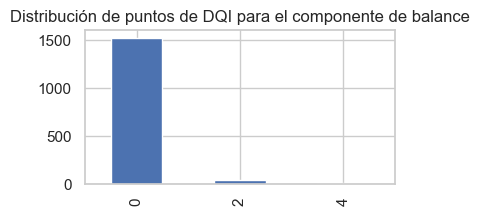

In [93]:
df_nutrients['fatty_acids_dqi'].value_counts().sort_index().plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de balance')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de balance'}>

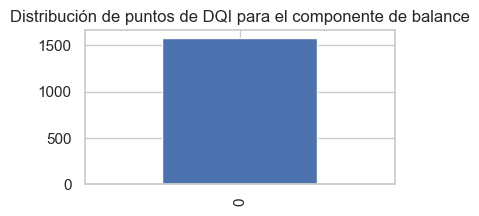

In [94]:
df_nutrients['macronutrients_dqi'].value_counts().sort_index().plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de balance')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de balance'}>

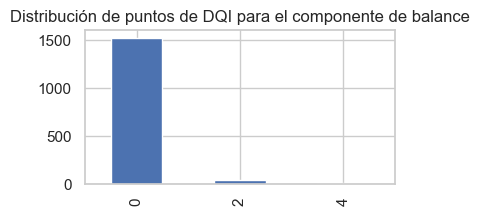

In [95]:
df_nutrients['balance_dqi'] = df_nutrients['fatty_acids_dqi'] + df_nutrients['macronutrients_dqi']

df_nutrients['balance_dqi'].value_counts().sort_index().plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de balance')

### Cálculo del componente de Moderation

Primero se calcula el número de calorias correspondientes a alimentos clasificados como "Calorias vacias" para cada persona.

In [96]:
df_empty_calories = df_base_dqi[df_base_dqi['calorias_vacias'] == 1].groupby('folio_integrante').sum()['energ_kcal']
df_empty_calories.rename('empty_calories', inplace=True)
df_nutrients = df_nutrients.merge(df_empty_calories, left_on='folio_integrante', right_index=True, how='left')
df_nutrients['empty_calories'].fillna(0, inplace=True)
df_nutrients.head()



,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,sodio,carbohydrt_ratio,lipid_tot_ratio,protein_ratio,macronutrients_dqi,poly_ratio,mono_ratio,fatty_acids_dqi,balance_dqi,empty_calories
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,5091.5500,0.485939,0.368031,0.146030,0,0.430983,0.794344,0,0,4098.8652
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,8193.4400,0.483158,0.370418,0.146424,0,0.219697,0.586749,0,0,3932.0892
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,5336.4200,0.483158,0.370418,0.146424,0,0.321980,0.729239,0,0,3932.0892
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,11323.7060,0.485939,0.368031,0.146030,0,0.462507,0.980014,0,0,4098.8652
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,6629.1974,0.483158,0.370418,0.146424,0,0.534538,1.207208,0,0,3932.0892


Se calcula el % de calorías vacías consumido por cada persona

In [97]:
df_nutrients['porc_empty_calories'] = df_nutrients['empty_calories'].div(df_nutrients['energ_kcal'])

Se calcula el valor del DQI-I según el % de calorías vacías consumidas por cada persona

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de calorías vacías'}>

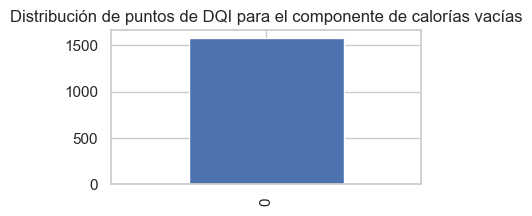

In [98]:

# Cálculo del porcentaje de calorías vacías
def calculate_empty_calories_dqi(row):

    # Evaluar según la imagen proporcionada:
    if row['porc_empty_calories'] <= 0.03:  # Menos del 3% de calorías vacías
        return 6
    elif 0.03 < row['porc_empty_calories']  <= 0.10:  # Entre 3% y 10%
        return 3
    else:  # Más del 10% de calorías vacías
        return 0


# Aplicamos la función a cada fila de datos
df_nutrients['empty_calories_dqi'] = df_nutrients.apply(calculate_empty_calories_dqi, axis=1)

df_nutrients['empty_calories_dqi'].value_counts().sort_values(ascending=False).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de calorías vacías')


A continuación se calculan los porcentajes de grasas totaless y saturadas que se usarán para calcular los otros componentes del DQI para Adecuacy

In [99]:
df_nutrients['fat_percentage'] = (df_nutrients['lipid_tot']*9).div(df_nutrients['energ_kcal'])
df_nutrients['fa_sat_percentage'] = (df_nutrients['fa_sat']*9).div(df_nutrients['energ_kcal'])

In [100]:
def calculate_total_fat_dqi(row):

    if row['fat_percentage'] <= 0.20:
        return 6
    elif row['fat_percentage'] > 0.30:
        return 0
    else:
        return 3

def calculate_saturated_fat_dqi(row):
    
        if row['fa_sat_percentage'] <= 0.07:
            return 6
        elif row['fa_sat_percentage'] > 0.10:
            return 0
        else:
            return 3

def calculate_cholesterol_dqi(row):
       
    colesterol_diario = row['chole'] / 7  # Dividimos el colesterol de 7 días para obtener el promedio diario

    # Aplicamos la lógica para el DQI basado en el consumo diario
    if colesterol_diario <= 300:
        return 6
    elif colesterol_diario > 400:
        return 0
    else:
        return 3

def calculate_sodium_dqi(row):
        
        sodio_diario = row['sodio'] / 7  # Dividimos el sodio de 7 días para obtener el promedio diario
    
        # Aplicamos la lógica para el DQI basado en el consumo diario
        if sodio_diario <= 2400:
            return 6
        elif sodio_diario > 3600:
            return 0
        else:
            return 3

df_nutrients['total_fat_dqi'] = df_nutrients.apply(calculate_total_fat_dqi, axis=1)
df_nutrients['saturated_fat_dqi'] = df_nutrients.apply(calculate_saturated_fat_dqi, axis=1)
df_nutrients['cholesterol_dqi'] = df_nutrients.apply(calculate_cholesterol_dqi, axis=1)
df_nutrients['sodium_dqi'] = df_nutrients.apply(calculate_sodium_dqi, axis=1)


<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de grasa total'}>

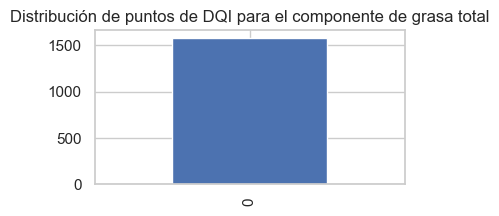

In [101]:
df_nutrients['total_fat_dqi'].value_counts().sort_values(ascending=False).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de grasa total')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de grasa saturada'}>

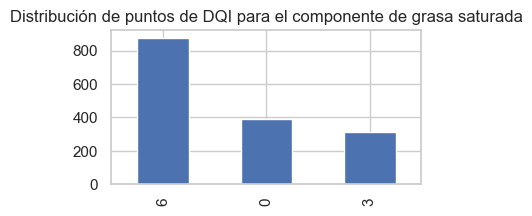

In [102]:
df_nutrients['saturated_fat_dqi'].value_counts().sort_values(ascending=False).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de grasa saturada')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de colesterol'}>

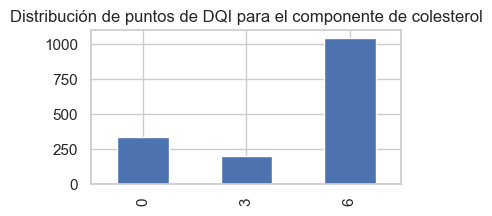

In [103]:
df_nutrients['cholesterol_dqi'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de colesterol')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de sodio'}>

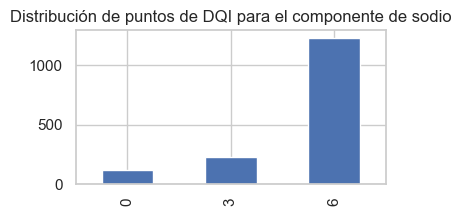

In [104]:
df_nutrients['sodium_dqi'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de sodio')

En la siguiente gráfica se muestran los resultados en gráfica de barra ordenados por frecuencia de los puntos obtenidos de DQI por la variable moderation que puede ir de 0 a 30. 

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de Moderation'}>

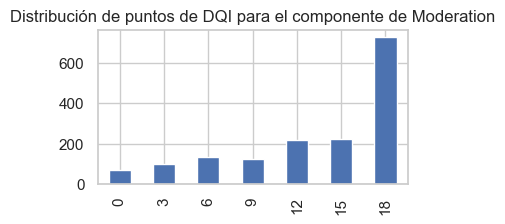

In [105]:
# En este momento faltan los datos de sodio y calorías vacías para calcular por completo el componente de Moderation.
df_nutrients['moderation_dqi'] = df_nutrients['empty_calories_dqi'] + df_nutrients['total_fat_dqi'] + df_nutrients['saturated_fat_dqi'] + df_nutrients['cholesterol_dqi'] + df_nutrients['sodium_dqi']
df_nutrients['moderation_dqi'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de Moderation')

### Calculo del componente Variety Food Groups


Definimos los datos que se necesitan para los calculos de Variety - food groups, Variety - protein sources y Adequacy


Leemos la información de a qué grupo pertenece cada alimento según la segmentación en el DQI-I

In [106]:
df_food_groups = pd.read_excel('./Data/OtrasFuentes/grupos_alimentos.xlsx')
df_food_groups.head()

,alimento,alimento_grupo,alimento_subgrupo
0,Leche Liconsa,Lacteos/Frijol,Lacteos
1,Otra leche opción A,Lacteos/Frijol,Lacteos
2,Otra leche opción B,Lacteos/Frijol,Lacteos
3,Otra leche opción C,Lacteos/Frijol,Lacteos
4,Leche preparada de sabor (chocolate u otro sabor),Lacteos/Frijol,Lacteos


In [107]:
df_food_general.head()

,folio_integrante,alimento,porcion_est,dias_consumo,especifique_otra_leche,veces_al_dia,tamaño_porcion,num_porciones
0,2022_01001001_01,Leche Liconsa,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
1,2022_01001001_01,Otra leche opción A,1 vaso (240 ml),7.0,Leche entera,2.0,ESTANDAR,1.0
2,2022_01001001_01,Otra leche opción B,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
3,2022_01001001_01,Otra leche opción C,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN
4,2022_01001001_01,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN


In [108]:
df_food_general = df_food_general.merge(df_food_groups, on='alimento', how='left')
df_food_general.head()

,folio_integrante,alimento,porcion_est,dias_consumo,especifique_otra_leche,veces_al_dia,tamaño_porcion,num_porciones,alimento_grupo,alimento_subgrupo
0,2022_01001001_01,Leche Liconsa,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN,Lacteos/Frijol,Lacteos
1,2022_01001001_01,Otra leche opción A,1 vaso (240 ml),7.0,Leche entera,2.0,ESTANDAR,1.0,Lacteos/Frijol,Lacteos
2,2022_01001001_01,Otra leche opción B,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN,Lacteos/Frijol,Lacteos
3,2022_01001001_01,Otra leche opción C,1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN,Lacteos/Frijol,Lacteos
4,2022_01001001_01,Leche preparada de sabor (chocolate u otro sabor),1 vaso (240 ml),0.0,NaN,NaN,NaN,NaN,Lacteos/Frijol,Lacteos


Se calcula el consumo semanal de cada alimento

In [109]:
dict_tamano_porcion = {'ESTANDAR':1, 'CHICO':0.5, 'GRANDE':1.5, 'MUY GRANDE':2, 'MEDIANO':1, 'MUY CHICO':0.3,'MUCHA':1.5,'POCA':0.5,'MODERADA':1}
df_food_general['tamaño_porcion_num'] = df_food_general['tamaño_porcion'].map(dict_tamano_porcion)
## Relleando valores faltantes
df_food_general[['dias_consumo', 'veces_al_dia', 'num_porciones', 'tamaño_porcion_num']] = df_food_general[['dias_consumo', 'veces_al_dia', 'num_porciones', 'tamaño_porcion_num']].fillna(0)
## Calculo consumo semanal
df_food_general['consumo_semanal'] = df_food_general['dias_consumo'] * df_food_general['veces_al_dia'] * df_food_general['num_porciones']*df_food_general['tamaño_porcion_num']

A continuación se calculan las porciones de cada grupo por dia por persona

In [110]:
df_group_servings = df_food_general.pivot_table(index='folio_integrante', columns='alimento_grupo', values='consumo_semanal', aggfunc='sum')
df_group_servings.fillna(0, inplace=True)
df_group_servings = df_group_servings/7
df_group_servings.head()

alimento_grupo,Aceites y Grasas,Azucares,Cereales,Frutas,Lacteos/Frijol,Misceláneos,Proteina,Unknown,Verduras
folio_integrante,,,,,,,,,
2022_01001001_01,1.000000,5.187143,0.285714,3.071429,3.785714,9.285714,1.142857,0.0,4.571429
2022_01001007_04,0.000000,5.571429,0.547143,0.571429,3.714286,9.071429,0.928571,0.0,1.214286
2022_01001016_13,0.000000,0.000000,1.285714,0.428571,2.714286,2.000000,0.857143,0.0,0.428571
2022_01001028_04,1.214286,3.857143,0.714286,1.821429,2.500000,7.657143,2.428571,0.0,8.714286
2022_01001028_06,0.571429,1.464286,0.285714,2.772857,1.535714,3.692857,1.428571,0.0,4.178571


In [111]:
# Se hace drop a columna Unkonwn que se generó en el proceso de pivot_table con df_food_general
df_group_servings.drop(columns='Unknown', inplace=True)

In [112]:
# añadir la palabra "porciones de " al nombre de cada columna
df_nutrients = df_nutrients.merge(df_group_servings, left_on='folio_integrante', right_index=True, how='left')
df_nutrients.head()

,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,sodium_dqi,moderation_dqi,Aceites y Grasas,Azucares,Cereales,Frutas,Lacteos/Frijol,Misceláneos,Proteina,Verduras
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,6,18,1.000000,5.187143,0.285714,3.071429,3.785714,9.285714,1.142857,4.571429
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,6,18,0.000000,5.571429,0.547143,0.571429,3.714286,9.071429,0.928571,1.214286
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,6,18,0.000000,0.000000,1.285714,0.428571,2.714286,2.000000,0.857143,0.428571
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,6,9,1.214286,3.857143,0.714286,1.821429,2.500000,7.657143,2.428571,8.714286
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,6,18,0.571429,1.464286,0.285714,2.772857,1.535714,3.692857,1.428571,4.178571


Según el DQI-I una persona debe consumir los 5 grupos de alimentos diariamente para obtener el puntaje máximo, por lo cual consideramos que un grupo hace parte de la dieta de la persona si el número de porciones consumidas en promedio por día es mayor o igual a 1, con base en esto se calculará el DQI para los grupos de alimentos

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de grupos de alimentos'}>

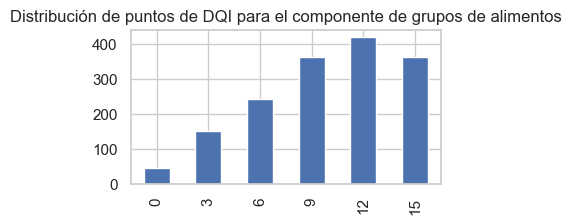

In [113]:
dqi_food_groups = ['Proteina', 'Lacteos/Frijol', 'Cereales', 'Verduras', 'Frutas']
def calculate_dqi_food_groups(row,columns):
    # contar el numero de columnas mayores a 1 en la fila
    groups_consumed_daily = 0
    for column in columns:
        if row[column] >= 1:
            groups_consumed_daily += 1
    
    if groups_consumed_daily == 5:
        return 15
    elif groups_consumed_daily == 4:
        return 12
    elif groups_consumed_daily == 3:
        return 9
    elif groups_consumed_daily == 2:
        return 6
    elif groups_consumed_daily == 1:
        return 3
    else:
        return 0
    
df_nutrients['dqi_food_groups'] = df_nutrients.apply(calculate_dqi_food_groups, axis=1, columns=dqi_food_groups)
df_nutrients['dqi_food_groups'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de grupos de alimentos')


### Calculo del componente Variety Protein Groups

Ahora se evalua la variedad al interior del grupo de la proteina

In [114]:
dqi_protein_sources = ['Carne', 'Pollo','Huevo', 'Pescado', 'Lacteos', 'Frijoles']
df_food_general_protein = df_food_general[df_food_general['alimento_subgrupo'].isin(dqi_protein_sources)]
df_food_general_protein['alimento_subgrupo'].value_counts()

Lacteos     28868
Carne       10843
Frijoles     9860
Pescado      6336
Pollo        4752
Huevo        3168
Name: alimento_subgrupo, dtype: int64

Se calculan las porciones promedio por día de cada subgrupo

In [115]:
df_group_servings_protein = df_food_general_protein.pivot_table(index='folio_integrante', columns='alimento_subgrupo', values='consumo_semanal', aggfunc='sum')
df_group_servings_protein.fillna(0, inplace=True)
df_group_servings_protein = df_group_servings_protein/7
df_group_servings_protein.head()

alimento_subgrupo,Carne,Frijoles,Huevo,Lacteos,Pescado,Pollo
folio_integrante,,,,,,
2022_01001001_01,0.714286,1.500000,0.000000,2.285714,0.142857,0.285714
2022_01001007_04,0.285714,0.214286,0.428571,3.500000,0.000000,0.214286
2022_01001016_13,0.285714,1.000000,0.428571,1.714286,0.000000,0.000000
2022_01001028_04,0.571429,0.571429,1.142857,1.928571,0.000000,0.285714
2022_01001028_06,0.178571,1.000000,1.142857,0.535714,0.000000,0.107143


In [116]:
# agregar la palabra "subgrupo de " al nombre de cada columna de df_group_servings_protein
df_group_servings_protein.columns = ['subgrupo de ' + column for column in df_group_servings_protein.columns]
df_group_servings_protein.head()

,subgrupo de Carne,subgrupo de Frijoles,subgrupo de Huevo,subgrupo de Lacteos,subgrupo de Pescado,subgrupo de Pollo
folio_integrante,,,,,,
2022_01001001_01,0.714286,1.500000,0.000000,2.285714,0.142857,0.285714
2022_01001007_04,0.285714,0.214286,0.428571,3.500000,0.000000,0.214286
2022_01001016_13,0.285714,1.000000,0.428571,1.714286,0.000000,0.000000
2022_01001028_04,0.571429,0.571429,1.142857,1.928571,0.000000,0.285714
2022_01001028_06,0.178571,1.000000,1.142857,0.535714,0.000000,0.107143


Según el DQI-I una persona debe consumir los 6 subgrupos de proteina con al menos media porción diariamente para obtener el puntaje máximo, por lo cual consideramos que un grupo hace parte de la dieta de la persona si el número de porciones 0.5, con base en esto se calculará el DQI para los subgrupos de proteina.

In [117]:
df_nutrients = df_nutrients.merge(df_group_servings_protein, left_on='folio_integrante', right_index=True, how='left')
df_nutrients.head()

,energ_kcal,carbohydrt,lipid_tot,protein,fiber_td,calcium,iron,ironhem,ironnohem,zinc,...,Misceláneos,Proteina,Verduras,dqi_food_groups,subgrupo de Carne,subgrupo de Frijoles,subgrupo de Huevo,subgrupo de Lacteos,subgrupo de Pescado,subgrupo de Pollo
folio_integrante,,,,,,,,,,,,,,,,,,,,,
2022_01001001_01,19607.7218,2404.5431,809.3797,722.590,215.8285,7933.4173,67.57558,2.0320,38.68308,53.623690,...,9.285714,1.142857,4.571429,12,0.714286,1.500000,0.000000,2.285714,0.142857,0.285714
2022_01001007_04,19521.9908,2388.5361,813.8637,723.861,215.2915,10420.9000,79.81630,2.1140,39.77830,74.473800,...,9.071429,0.928571,1.214286,6,0.285714,0.214286,0.428571,3.500000,0.000000,0.214286
2022_01001016_13,19521.9908,2388.5361,813.8637,723.861,215.2915,3528.2880,39.58570,1.1180,19.63820,33.327000,...,2.000000,0.857143,0.428571,6,0.285714,1.000000,0.428571,1.714286,0.000000,0.000000
2022_01001028_04,19607.7218,2404.5431,809.3797,722.590,215.8285,7778.0270,85.94970,5.2282,66.92500,68.392875,...,7.657143,2.428571,8.714286,12,0.571429,0.571429,1.142857,1.928571,0.000000,0.285714
2022_01001028_06,19521.9908,2388.5361,813.8637,723.861,215.2915,3337.8500,43.15056,0.7647,36.26686,30.666847,...,3.692857,1.428571,4.178571,12,0.178571,1.000000,1.142857,0.535714,0.000000,0.107143


<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de fuentes de proteínas'}>

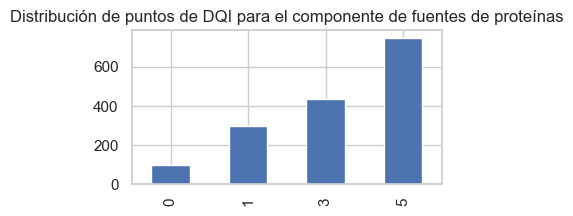

In [118]:

def calculate_dqi_food_groups(row, dqi_protein_sources):
    # contar el numero de columnas mayores a 0.5 en la fila
    groups_consumed_daily = 0
    for column in dqi_protein_sources:
        if row[column] >= 0.5:
            groups_consumed_daily += 1
    if groups_consumed_daily >= 3:
        return 5
    elif groups_consumed_daily == 2:
        return 3
    elif groups_consumed_daily == 1:
        return 1
    else:
        return 0

df_nutrients['dqi_protein_sources'] = df_nutrients.apply(calculate_dqi_food_groups, axis=1, dqi_protein_sources=df_group_servings_protein.columns)
df_nutrients['dqi_protein_sources'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de fuentes de proteínas')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de variedad'}>

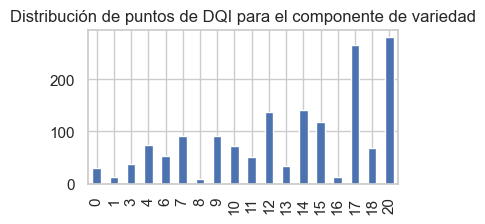

In [119]:
df_nutrients['variety_dqi'] = df_nutrients['dqi_food_groups'] + df_nutrients['dqi_protein_sources']
df_nutrients['variety_dqi'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de variedad')

### Calculo del componente Adequacy


Se realizarán los cálculos del adecuacy suponiendo una dieta de todos los individuos de 1700 calorias diarias

Text(0.5, 1.0, 'Histograma de consumo diario de calorías')

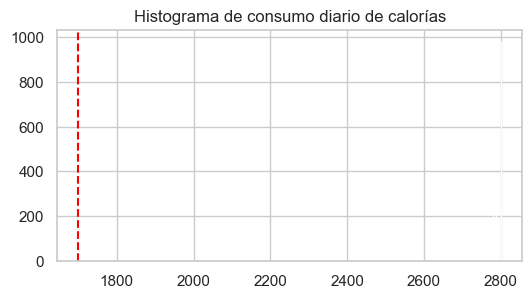

In [120]:
# Generar un histograma del numero de calorías consumidas por persona, marcando el valor de 1700 como referencia
plt.figure(figsize=(6, 3))
plt.hist(df_nutrients['energ_kcal']/7, bins=100)
plt.axvline(x=1700, color='red', linestyle='--')
plt.title('Histograma de consumo diario de calorías')


Para las frutas el valor de referencia es de 2 porciones por día, para las frutas 3 y para los cereales 6.

In [121]:
def calculate_adecucy_groups(row, group ,reference):
    pertentage_intake = row[group] / reference
    if pertentage_intake >= 1:
        return 5
    elif pertentage_intake >= 0.8:
        return 4
    elif pertentage_intake >= 0.6:
        return 3
    elif pertentage_intake >= 0.4:
        return 2
    elif pertentage_intake >= 0.2:
        return 1
    else:
        return 0

df_nutrients['dqi_adequacy_fruits'] = df_nutrients.apply(calculate_adecucy_groups, axis=1, group='Frutas', reference=2)
df_nutrients['dqi_adequacy_vegetables'] = df_nutrients.apply(calculate_adecucy_groups, axis=1, group='Verduras', reference=3)
df_nutrients['dqi_adequacy_grains'] = df_nutrients.apply(calculate_adecucy_groups, axis=1, group='Cereales', reference=6)
df_nutrients['dqi_adequacy_fiber'] = df_nutrients.apply(calculate_adecucy_groups, axis=1, group='fiber_td', reference=20*7)



<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de frutas'}>

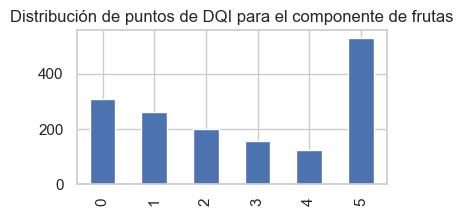

In [122]:
df_nutrients['dqi_adequacy_fruits'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de frutas')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de verduras'}>

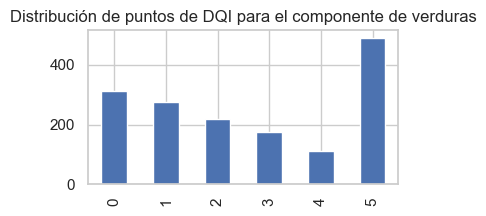

In [123]:
df_nutrients['dqi_adequacy_vegetables'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de verduras')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de cereales'}>

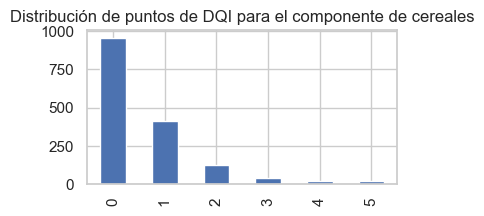

In [124]:
df_nutrients['dqi_adequacy_grains'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de cereales')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de fibra'}>

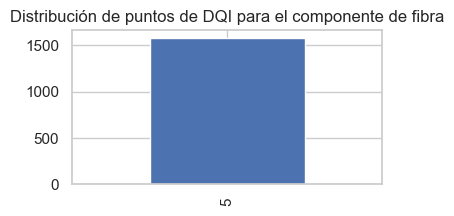

In [125]:
df_nutrients['dqi_adequacy_fiber'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de fibra')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de proteínas'}>

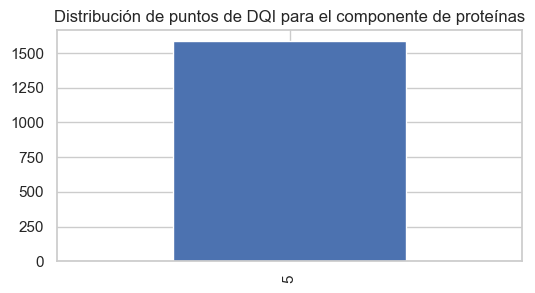

In [126]:
df_nutrients['protein_percentage'] = (df_nutrients['protein']*4).div(df_nutrients['energ_kcal'])
df_nutrients['dqi_adequacy_protein'] = df_nutrients.apply(calculate_adecucy_groups, axis=1, group='protein_percentage', reference=0.1)
df_nutrients['dqi_adequacy_protein'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(6, 3), title='Distribución de puntos de DQI para el componente de proteínas')

Los siguientes valores se calculan con base en la cantidad de nutrientes sugeridos por cada persona según su género.

In [127]:
rda = {
    'Hombre': {
        'Calcio': 1000,
        'Hierro': 8,
        'Magnesio': 400,
        'Proteina': 56,
        'Vitamina A': 900,
        'Vitamina C': 90,
        'Vitamina D': 15,
        'Vitamina E': 15,
        'Vitamina K': 120,
        'Zinc': 11,
        'Fibra': 38
    },
    'Mujer': {
        'Calcio': 1000,
        'Hierro': 18,
        'Magnesio': 310,
        'Proteina': 46,
        'Vitamina A': 700,
        'Vitamina C': 75,
        'Vitamina D': 15,
        'Vitamina E': 15,
        'Vitamina K': 90,
        'Zinc': 8,
        'Fibra': 25
    }
}


In [128]:
df_dem_final.head()

,folio_integrante,edad,ponderador,grupo,resultado_general_entrevista,region_Centro,region_Centro Norte,region_Frontera,region_Pacifico-Norte,region_Pacífico Sur,region_Pacífico-Centro,region_Península,sexo_Mujer,estrato_Rural ( <2500 Hab ),"estrato_Urbano ( 2500-99,999 Hab)"
0,2022_01001001_01,51,8717.185479,Adolescentes y Adultos,1,0,1,0,0,0,0,0,1,0,0
1,2022_01001028_04,26,51475.173556,Adolescentes y Adultos,1,0,1,0,0,0,0,0,1,0,0
2,2022_01001034_03,12,16477.855758,Adolescentes y Adultos,1,0,1,0,0,0,0,0,0,0,0
3,2022_01001041_04,12,11801.483710,Adolescentes y Adultos,1,0,1,0,0,0,0,0,0,0,0
4,2022_01001042_01,62,7032.174356,Adolescentes y Adultos,1,0,1,0,0,0,0,0,1,0,0


In [129]:
def calculate_rda_nutritient_consumption(row,rda,rda_nutrient,food_nutrient,df_dem):
    genre = 'Mujer' if int(df_dem[df_dem['folio_integrante'] == row.name]['sexo_Mujer']) == 1 else 'Hombre'


    rda_value = rda[genre][rda_nutrient]
        
    pertentage_intake = (row[food_nutrient] / 7)/ rda_value
    if pertentage_intake >= 1:
        return 5
    elif pertentage_intake >= 0.8:
        return 4
    elif pertentage_intake >= 0.6:
        return 3
    elif pertentage_intake >= 0.4:
        return 2
    elif pertentage_intake >= 0.2:
        return 1
    else:
        return 0
    
df_nutrients['dqi_adequacy_calcium'] = df_nutrients.apply(calculate_rda_nutritient_consumption, axis=1, rda=rda, rda_nutrient='Calcio', food_nutrient='calcium',df_dem=df_dem_final)
df_nutrients['dqi_adequacy_iron'] = df_nutrients.apply(calculate_rda_nutritient_consumption, axis=1, rda=rda, rda_nutrient='Hierro', food_nutrient='iron',df_dem=df_dem_final)
df_nutrients['dqi_adequacy_vitamin_c'] = df_nutrients.apply(calculate_rda_nutritient_consumption, axis=1, rda=rda, rda_nutrient='Vitamina C', food_nutrient='vit_c',df_dem=df_dem_final)

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de calcio'}>

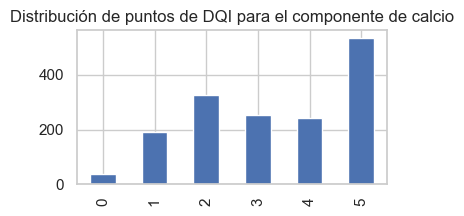

In [130]:
df_nutrients['dqi_adequacy_calcium'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de calcio')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de hierro'}>

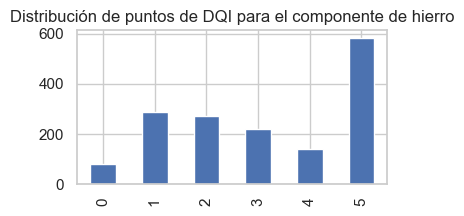

In [131]:
df_nutrients['dqi_adequacy_iron'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de hierro')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de vitamina C'}>

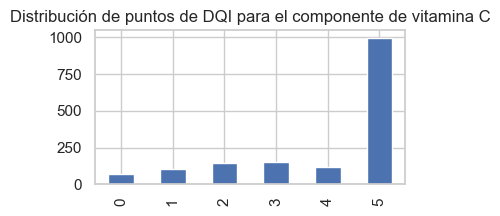

In [132]:
df_nutrients['dqi_adequacy_vitamin_c'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(4, 2), title='Distribución de puntos de DQI para el componente de vitamina C')

<AxesSubplot: title={'center': 'Distribución de puntos de DQI para el componente de adecuación'}>

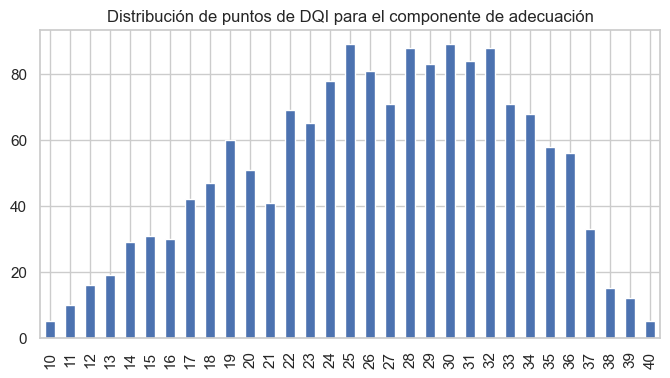

In [133]:
df_nutrients['dqi_adecuacy'] = df_nutrients['dqi_adequacy_fruits'] + df_nutrients['dqi_adequacy_vegetables'] + df_nutrients['dqi_adequacy_grains'] + \
                                df_nutrients['dqi_adequacy_fiber'] + df_nutrients['dqi_adequacy_protein'] + df_nutrients['dqi_adequacy_calcium'] + \
                                df_nutrients['dqi_adequacy_iron'] + df_nutrients['dqi_adequacy_vitamin_c']
df_nutrients['dqi_adecuacy'].value_counts().sort_index(ascending=True).plot(kind='bar', figsize=(8, 4), title='Distribución de puntos de DQI para el componente de adecuación')

# Análisis descriptivo DQI-I

Se suman todos los valores de DQI calculados previamente para tener una columna de **dqi_total** para tener el resultado total por registro. 

In [134]:
df_nutrients['dqi_total'] = df_nutrients['balance_dqi'] + df_nutrients['moderation_dqi'] + df_nutrients['dqi_adecuacy'] + df_nutrients['variety_dqi']

In [135]:
df_dqi_final_merged = df_nutrients.merge(df_dem_final, on='folio_integrante', how='left')

In [136]:
df_dqi = df_dqi_final_merged.copy()
df_dqi = df_dqi[['edad', 'ponderador', 'resultado_general_entrevista', 'region_Centro', 'region_Centro Norte',
       'region_Frontera', 'region_Pacifico-Norte', 'region_Pacífico Sur',
       'region_Pacífico-Centro', 'region_Península', 'sexo_Mujer',
       'estrato_Rural  ( <2500 Hab )', 'estrato_Urbano ( 2500-99,999 Hab)','balance_dqi', 'moderation_dqi', 'variety_dqi', 'dqi_food_groups', 'dqi_protein_sources', 'dqi_adecuacy', 'dqi_total']]
df_dqi.head()

,edad,ponderador,resultado_general_entrevista,region_Centro,region_Centro Norte,region_Frontera,region_Pacifico-Norte,region_Pacífico Sur,region_Pacífico-Centro,region_Península,sexo_Mujer,estrato_Rural ( <2500 Hab ),"estrato_Urbano ( 2500-99,999 Hab)",balance_dqi,moderation_dqi,variety_dqi,dqi_food_groups,dqi_protein_sources,dqi_adecuacy,dqi_total
0,51,8717.185479,1,0,1,0,0,0,0,0,1,0,0,0,18,17,12,5,32,67
1,1,5378.108847,1,0,1,0,0,0,0,0,0,0,0,0,18,7,6,1,28,53
2,4,4692.485672,1,0,1,0,0,0,0,0,0,0,0,0,18,9,6,3,19,46
3,26,51475.173556,1,0,1,0,0,0,0,0,1,0,0,0,9,17,12,5,32,58
4,2,6860.703803,1,0,1,0,0,0,0,0,0,0,0,0,18,17,12,5,30,65


In [137]:
## reversar one hot encoding

df_dqi['region'] = df_dqi[['region_Centro', 'region_Centro Norte', 'region_Frontera', 'region_Pacifico-Norte', 'region_Pacífico Sur', 'region_Pacífico-Centro', 'region_Península']].idxmax(axis=1)
df_dqi['estrato'] = df_dqi[['estrato_Rural  ( <2500 Hab )', 'estrato_Urbano ( 2500-99,999 Hab)']].idxmax(axis=1)
df_dqi.drop(columns=['region_Centro', 'region_Centro Norte', 'region_Frontera', 'region_Pacifico-Norte', 'region_Pacífico Sur', 'region_Pacífico-Centro', 'region_Península', 'estrato_Rural  ( <2500 Hab )', 'estrato_Urbano ( 2500-99,999 Hab)'], inplace=True)



In [138]:
# Crear una columna sexo a partir de la columna sexo_Mujer
df_dqi['sexo'] = df_dqi['sexo_Mujer'].map({1: 'Mujer', 0: 'Hombre'})
df_dqi.drop(columns=['sexo_Mujer'], inplace=True)


In [139]:
df_dqi['region'] = df_dqi['region'].apply(lambda x: x.split('_')[1])
df_dqi['estrato'] = df_dqi['estrato'].apply(lambda x: x.split('_')[1])
df_dqi.head()

,edad,ponderador,resultado_general_entrevista,balance_dqi,moderation_dqi,variety_dqi,dqi_food_groups,dqi_protein_sources,dqi_adecuacy,dqi_total,region,estrato,sexo
0,51,8717.185479,1,0,18,17,12,5,32,67,Centro Norte,Rural ( <2500 Hab ),Mujer
1,1,5378.108847,1,0,18,7,6,1,28,53,Centro Norte,Rural ( <2500 Hab ),Hombre
2,4,4692.485672,1,0,18,9,6,3,19,46,Centro Norte,Rural ( <2500 Hab ),Hombre
3,26,51475.173556,1,0,9,17,12,5,32,58,Centro Norte,Rural ( <2500 Hab ),Mujer
4,2,6860.703803,1,0,18,17,12,5,30,65,Centro Norte,Rural ( <2500 Hab ),Hombre


Se filtran únicamente los adultos y personas que tuvieron una encuesta completa

In [140]:
df_dqi = df_dqi[(df_dqi['edad'] >= 18) & (df_dqi['edad'] < 65) & (df_dqi['resultado_general_entrevista'] == 1)]

In [141]:
# normalizar ponderacion
df_dqi['ponderador'] = df_dqi['ponderador'].div(df_dqi['ponderador'].sum())


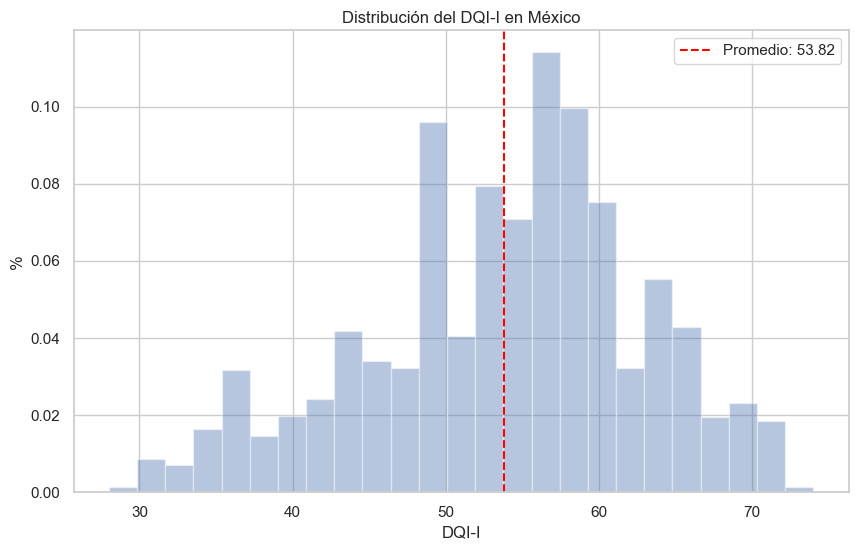

In [142]:
weighted_mean = (df_dqi['dqi_total'] * df_dqi['ponderador']).sum() / df_dqi['ponderador'].sum()
plt.figure(figsize=(10, 6))
sns.distplot(df_dqi.dqi_total, bins=25, 
    hist_kws={'weights':df_dqi.ponderador}, norm_hist=False,kde=False)
plt.axvline(weighted_mean, color='red', linestyle='--', label=f'Promedio: {weighted_mean:.2f}')
plt.title("Distribución del DQI-I en México")
plt.xlabel("DQI-I")
plt.ylabel("%")
plt.legend()
plt.show()

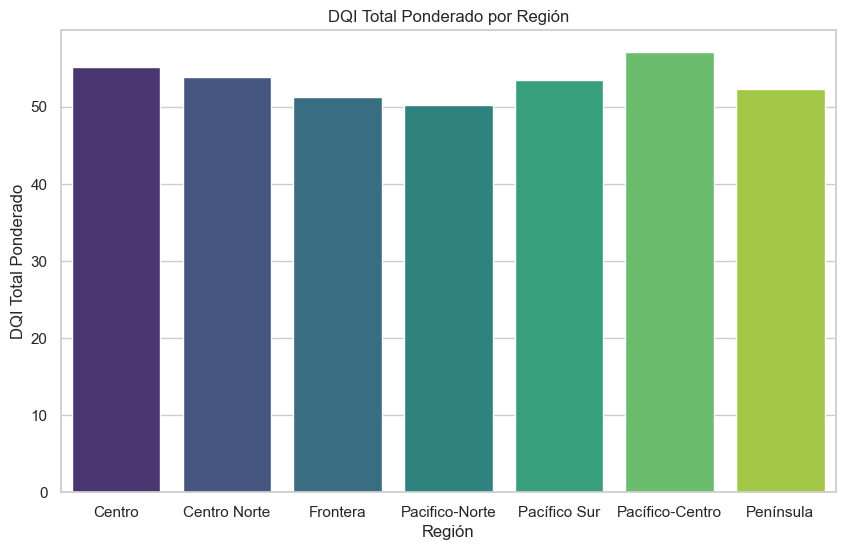

In [143]:
# Calcular el DQI total ponderado por región
weighted_dqi_by_region = df_dqi.groupby('region').apply(
    lambda x: (x['dqi_total'] * x['ponderador']).sum() / x['ponderador'].sum()
).reset_index(name='weighted_dqi_total')

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
sns.barplot(data=weighted_dqi_by_region, x='region', y='weighted_dqi_total', palette="viridis")
plt.title("DQI Total Ponderado por Región")
plt.xlabel("Región")
plt.ylabel("DQI Total Ponderado")
plt.show()

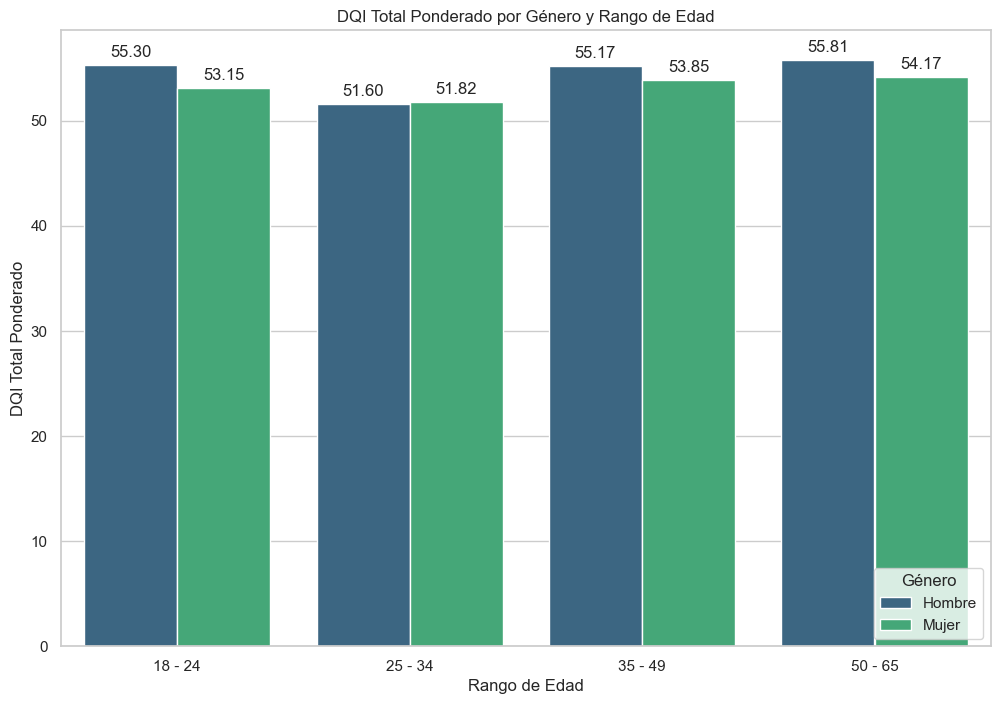

In [144]:
# Crear rangos de edad
labels = ['18 - 24', '25 - 34', '35 - 49', '50 - 65']
bins = [18, 25, 35, 50, 65]
df_dqi['edad_rango'] = pd.cut(df_dqi['edad'], bins=bins, labels=labels, right=False)

# Calcular el DQI total ponderado por género y rango de edad
weighted_dqi_by_gender_age = df_dqi.groupby(['sexo', 'edad_rango']).apply(
    lambda x: (x['dqi_total'] * x['ponderador']).sum() / x['ponderador'].sum()
).reset_index(name='weighted_dqi_total')

# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
ax = sns.barplot(data=weighted_dqi_by_gender_age, x='edad_rango', y='weighted_dqi_total', hue='sexo', palette="viridis")
plt.title("DQI Total Ponderado por Género y Rango de Edad")
plt.xlabel("Rango de Edad")
plt.ylabel("DQI Total Ponderado")
plt.legend(title="Género", loc='lower right')

# Añadir etiquetas de datos
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.2f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha = 'center', va = 'center', 
                xytext = (0, 9), 
                textcoords = 'offset points')

plt.show()

In [145]:
df_dqi.to_csv('./Data/Processed/dqi.csv', index=False,sep=';')